# **ПРОЕКТ «Предсказание оттока клиентов из банка»**

**Выполнил**: Юмаев Егор

## **Введение. Описание проекта, его цель и задачи**

---

В связи с выявленной тенденцией ежемесячного небольшого оттока клиентов из «Бета-Банка» необходимо провести исследование и спрогнозировать вероятность ухода из банка клиентов. Согласно оценкам банковских маркетологов сохранение текущих клиентов обходится банку дешевле, чем привлечение новых, поэтому требуется корректировка Стратегии удержания клиентов. Важным элементом стратегии станет модель, обученная с помощью алгоритма машинного обучения, предсказывающая, прекратит ли деловые отношения с банком тот или иной клиент в ближайшее время. Предсказания модели позволят сформировать персональное предложение для клиента, обеспечив его удержание в банке.

**Цель исследования**: построение модели машинного обучения, предсказывающей отток клиентов из банка.

В ходе выполнения проекта были поставлены и решены следующие **задачи**:

**(1)** загрузка, общее изучение массива данных и их предобработка

**(2)** исследование баланса классов и обучение модели без учета дисбаланса

**(3)** улучшение качества модели с учетом дисбаланса классов; обучение разных моделей и выявление модели с лучшими метриками

**(4)** финальное тестирование модели с лучшими метриками

Индикатором достижения цели является получение значения метрики **f1** на тестовой выборке **> 0.59**.

Для достижения поставленной цели решена **задача классификации**.

## **1 Подготовка данных**

---

### **1.1. Импорт необходимых библиотек, структур данных и функций. Загрузка данных**


---


In [ ]:
# устанавливаем библиотеку skimpy,
# функция из которой понадобится для приведения названий
# столбцов датасета к snake_case
!pip install -q skimpy

# устанавливаем библиотеку phik,
# функции из которой понадобятся для изучения
# корреляции между признаками
!pip install phik

# устанавливаем библиотеку imbalanced-learn,
# функции из которой понадобятся для экспериментов
# по устранению дисбаланса классов
!pip install -q imbalanced-learn

In [2]:
# импортируем необходимые библиотеки, структуры данных и функции

# основные библиотеки
import pandas as pd
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams, rcParamsDefault
from collections import Counter
from skimpy import clean_columns
from tqdm.notebook import tqdm

# устранение дисбаланса классов
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek

# подготовка к машинному обучению
from phik.report import (
    correlation_report,
    plot_correlation_matrix)
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler)
from sklearn.feature_selection import (
    mutual_info_regression,
    SelectKBest)
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV)

# модели машинного обучения
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# метрики машинного обучения
from sklearn.metrics import (
    f1_score,
    roc_auc_score)

%matplotlib inline

# убираем 'красные' предупреждения
import warnings
warnings.filterwarnings("ignore")

In [3]:
# настраиваем параметры отображения рисунков
rcParams['figure.figsize'] = 7, 4
%config InlineBackend.figure_format = 'svg'
%matplotlib inline
factor = 10
default_dpi = rcParamsDefault['figure.dpi']
rcParams['figure.dpi'] = default_dpi*factor

In [4]:
# для того, чтобы обеспечить "читаемость" всех столбцов,
# применим функцию pd.set_option()
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
# подгружаем файл с данными
try:
    df = pd.read_csv('/datasets/Churn.csv')
    print('Dataset load from Practicum cloud')
except:
    from google.colab import drive
    drive.mount('/content/drive')
    path1 = '/content/drive/MyDrive/mydata/Churn.csv'
    data = pd.read_csv(path1)
    print('Dataset load from GoogleDrive')

Mounted at /content/drive
Dataset load from GoogleDrive


In [6]:
# чтобы проверить, загружены ли данные,
# выведем выбранные наугад пять строк из датасета
data.sample(5)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9875,9876,15747130,Tsao,521,France,Male,39,7.0,0.00,2,0,1,653.58,0
9919,9920,15798084,Murray,688,France,Male,26,0.0,0.00,2,1,0,105784.85,0
9328,9329,15763093,Nucci,540,Germany,Female,35,7.0,128369.75,2,1,0,198256.15,0
9661,9662,15742019,Benford,675,France,Female,39,6.0,0.00,2,0,0,83419.15,0
7053,7054,15815271,Ritchie,755,Germany,Male,43,NaN,165048.50,3,1,0,16929.41,1


**Выводы по 1.1 Импорт необходимых библиотек, структур данных и функций. Загрузка данных**:

**(1)** необходимые библиотеки, структуры данных и модули импортированы

**(2)** данные из датасета загружены и готовы для предварительного изучения и предобработки

### **1.2 Общее ознакомление с данными и предварительная обработка данных**


---

In [7]:
# изучим размер датасета
data.shape, data.size

((10000, 14), 140000)

Датасет включает 10_000 строк, 14 столбцов (признаков), 140_000 ячеек

In [8]:
# изучим названия колонок
data.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

Формат заголовков колонок не соответствует общепринятому стилю snake_case, поэтому приведем их в соответствие нормам с помощью функции clean_columns библиотеки skimpy

In [9]:
# приводим заголовки в соответствие стилю snake_case
data = clean_columns(data)

# проверяем стиль написания заголовков
data.columns

Index(['row_number', 'customer_id', 'surname', 'credit_score', 'geography',
       'gender', 'age', 'tenure', 'balance', 'num_of_products', 'has_cr_card',
       'is_active_member', 'estimated_salary', 'exited'],
      dtype='object')

In [10]:
# изучим тип данных в столбцах датасета
data.dtypes

row_number            int64
customer_id           int64
surname              object
credit_score          int64
geography            object
gender               object
age                   int64
tenure              float64
balance             float64
num_of_products       int64
has_cr_card           int64
is_active_member      int64
estimated_salary    float64
exited                int64
dtype: object

In [11]:
data.dtypes.value_counts()

int64      8
object     3
float64    3
Name: count, dtype: int64

Вопрос по типу данных есть только по трем столбцам из 14: 'tenure', 'balance', 'estimated_salary'. Тип данных всех трех столбцов float64. В связи с тем, что в машинном обучении с помощью библиотеки sklearn используется тип данных float32, вещественные значения float64 будут округлены, что снизит качество предсказания модели. Это снижение не будет значительным, т.к. значения в столбцах 'balance' и 'estimated_salary' значительны, и дробная часть не может оказать заметного влияния на результаты вычислений. Что касается столбца 'tenure', то данные в нем хотя и представлены как вещественные числа, на самом деле целочисленные.

In [12]:
# проверим, какие уникальные значения есть в столбце 'tenure',
# вычислим количество каждого уникального значения
data.groupby('tenure')['tenure'].count()

tenure
0.0     382
1.0     952
2.0     950
3.0     928
4.0     885
5.0     927
6.0     881
7.0     925
8.0     933
9.0     882
10.0    446
Name: tenure, dtype: int64

In [13]:
# проверим уникальные значения в столбце 'tenure' с учетом пропусков
data['tenure'].value_counts(dropna = False).sort_values()

tenure
0.0     382
10.0    446
6.0     881
9.0     882
4.0     885
NaN     909
7.0     925
5.0     927
3.0     928
8.0     933
2.0     950
1.0     952
Name: count, dtype: int64

Как мы видим, изменение формата для столбца 'tenure' с float64 на float32 никак не повлияет на обучение моделей, так как округление числам из этого столбца 'не грозит'. У столбцов 'balance', 'estimated_salary' тип данных будет изменен с float64 на float32. Тип данных будет изменен после изучения пропусков в столбцах датасета

In [14]:
# изучим общую статистику данных датасета
data.describe().T

,count,mean,std,min,25%,50%,75%,max
row_number,10000.0,5.000500e+03,2886.895680,1.00,2500.75,5.000500e+03,7.500250e+03,10000.00
customer_id,10000.0,1.569094e+07,71936.186123,15565701.00,15628528.25,1.569074e+07,1.575323e+07,15815690.00
credit_score,10000.0,6.505288e+02,96.653299,350.00,584.00,6.520000e+02,7.180000e+02,850.00
age,10000.0,3.892180e+01,10.487806,18.00,32.00,3.700000e+01,4.400000e+01,92.00
tenure,9091.0,4.997690e+00,2.894723,0.00,2.00,5.000000e+00,7.000000e+00,10.00
balance,10000.0,7.648589e+04,62397.405202,0.00,0.00,9.719854e+04,1.276442e+05,250898.09
num_of_products,10000.0,1.530200e+00,0.581654,1.00,1.00,1.000000e+00,2.000000e+00,4.00
has_cr_card,10000.0,7.055000e-01,0.455840,0.00,0.00,1.000000e+00,1.000000e+00,1.00
is_active_member,10000.0,5.151000e-01,0.499797,0.00,0.00,1.000000e+00,1.000000e+00,1.00
estimated_salary,10000.0,1.000902e+05,57510.492818,11.58,51002.11,1.001939e+05,1.493882e+05,199992.48


Никаких 'подводных камней' в общей статистике не просматривается. Обратим внимание на один показатель: минимальная предполагаемая заработная плата клиента банка составляет 11 рублей 58 копеек. Ничего сверхъестественного в этом нет, поскольку высоко развита теневая экономика, фриланс, самозанятость. Минимальный возраст клиента банка 18 лет - клиент в этом, да и не только в этом возрасте вполне может не иметь работы. Технологии оценки, конечно, развиваются, развивается система межведомственного электронного документооборота, и не исключено, что Федеральная налоговая служба на сегодняшний день имеет возможность дать приближенную к реальности оценку доходов того или иного гражданина. Но эта информация не подлежит распространению и руководство 'Бета-Банка' не имеет к ней доступа и ограничивается той статистикой, которая доступна по межбанковскому электронному документообороту

In [15]:
# проверим, есть ли в датасете явные дубликаты
data.duplicated().sum()

0

Явных дубликатов в датасете нет. Неявные дубликаты с учетом значений нескольких столбцов могут быть между столбцами 'customer_id', 'surname', 'credit_score'. Проверим неявные дубликаты между группами столбцов:

- 'customer_id', 'surname'

- 'customer_id', 'surname', 'credit_score'

In [16]:
# поиск неявных дубликатов по группе колонок 'customer_id' и 'surname'
data.duplicated(subset = ['customer_id', 'surname'], keep = False).sum()

0

In [17]:
# поиск неявных дубликатов по группе колонок 'customer_id', 'surname'
# и 'credit_score'
data.duplicated(subset = ['customer_id', 'surname', 'credit_score'],
                keep = False).sum()

0

Неявные дубликаты в датасете не обнаружены. Проверим наличие пропусков в датасете

In [18]:
# проверим наличие пропусков в столбцах датасета
data.isna().sum()

row_number            0
customer_id           0
surname               0
credit_score          0
geography             0
gender                0
age                   0
tenure              909
balance               0
num_of_products       0
has_cr_card           0
is_active_member      0
estimated_salary      0
exited                0
dtype: int64

In [19]:
# определим долю в % пропущенных значений строк от всех значений строк
data.isna().sum() / data.shape[0] * 100

row_number          0.00
customer_id         0.00
surname             0.00
credit_score        0.00
geography           0.00
gender              0.00
age                 0.00
tenure              9.09
balance             0.00
num_of_products     0.00
has_cr_card         0.00
is_active_member    0.00
estimated_salary    0.00
exited              0.00
dtype: float64

В целом датасет заполнен качественно: в 13 столбцах нет пропусков. В столбце 'tenure', отражающем информацию о периоде, в течении которого человек является клиентом банка,  пропущена информация в 9,09% случаев. Согласно получившему распространение подходу, до 10% датасета с пропущенными значениями может быть удалено. Однако, остальные 13 столбцов заполнены полностью. Удалив 9,09% строк, мы теряем большое количество других признаков. Наиболее целесообразным решением в указанной ситуации считаем заполнение пропусков.

Однако, прежде чем перейти к заполнению пропущенных значений изучим подробнее следующий момент: есть ли зависимость между пропущенными значениями в столбце 'tenure' и значениями в столбцах:

  - 'geography' (страна проживания клиента)

  - 'age' (возраст клиента)

Возможное влияние на пропущенные значения столбца 'tenure' значений из других столбцов либо не очевидно, либо, как в случае со столбцом 'estimated_salary' количество уникальных значений в последнем слишком велико и не позволит сделать значимые выводы


In [20]:
# отфильтруем из датасета data все строки, в которых
# в столбце 'tenure' есть пропущенные значения
data_tenure = data.query('tenure.isna()', engine='python')
data_tenure.shape

(909, 14)

In [21]:
# выведем первые пять строк датасета data_tenure,
# чтобы убедиться, что данные отображаются корректно
data_tenure.head()

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
30,31,15589475,Azikiwe,591,Spain,Female,39,NaN,0.00,3,1,0,140469.38,1
48,49,15766205,Yin,550,Germany,Male,38,NaN,103391.38,1,0,1,90878.13,0
51,52,15768193,Trevisani,585,Germany,Male,36,NaN,146050.97,2,0,0,86424.57,0
53,54,15702298,Parkhill,655,Germany,Male,41,NaN,125561.97,1,0,0,164040.94,1
60,61,15651280,Hunter,742,Germany,Male,35,NaN,136857.00,1,0,0,84509.57,0


In [22]:
# посчитаем количество пропусков по стране проживания клиента банка
data_tenure.geography.value_counts().sort_values(ascending = False)

geography
France     464
Spain      229
Germany    216
Name: count, dtype: int64

Сам по себе результат расчета количества пропусков в столбце 'tenure' по стране проживания клиента не информативен. Поэтому создадим еще один датасет, - отфильтруем из исходного датасета все строки, значения в которых в столбце 'tenure' заполнены, и вычислим количество клиентов по странам мира

In [23]:
# отфильтруем из датасета data все строки, в которых
# в столбце 'tenure' значения заполнены
data_tenure_notna = data.query('tenure.notna()', engine='python')
data_tenure_notna.shape

(9091, 14)

In [24]:
# посчитаем количество клиентов по стране проживания клиента банка
# по заполненным значениям столбца 'tenure'
data_tenure_notna.geography.value_counts().sort_values(ascending = False)

geography
France     4550
Germany    2293
Spain      2248
Name: count, dtype: int64

Между количеством стран проживания клиентов не выявлено характерной взаимосвязи, на основе которой можно было бы предложить особый вариант заполнения пропусков в столбце 'tenure': в каждой из стран примерно в 10% случаев не указана информация, сколько лет человек является клиентом банка.

Проверим, есть ли какая-нибудь обращающая на себя внимание взаимосвязь между пропущенными значениями в столбце 'tenure' и возрастом клиента (столбец 'age'). Для этого воспользуемся созданными датасетами data_tenure и data_tenure_notna

In [25]:
# посчитаем количество пропущенных значений
# в зависимости от возвраста клиента банка
# результаты сохраним в датафрейм
age_tenure_isna = pd.DataFrame(data_tenure.age.value_counts())
age_tenure_isna.columns = ['Количество клиентов (\'tenure\' пропущено)']
age_tenure_isna.head()

,Количество клиентов ('tenure' пропущено)
age,
36,55
38,53
40,49
31,45
32,44


In [26]:
# посчитаем количество клиентов соответствующего возраста,
# информация о которых в столбце 'tenure' заполнена,
# результат сохраним в датафрейм
age_tenure_notna = pd.DataFrame(data_tenure_notna.age.value_counts())
age_tenure_notna.columns = ['Количество клиентов (\'tenure\' заполнено)']
age_tenure_notna.head()

,Количество клиентов ('tenure' заполнено)
age,
37,435
35,431
38,424
34,412
33,403


In [27]:
# объедиянем датафреймы age_tenure_notna и age_tenure_isna
# по индексам первого и второго
age_tenure_final = pd.merge(
    age_tenure_notna,
    age_tenure_isna,
    left_index = True,
    right_index = True
)

# создаем столбец с долей пропущенных значений среди всех значений
# среди всех значений соответствующего возраста
age_tenure_final['Доля пропущенных значений'] = (
    age_tenure_final['Количество клиентов (\'tenure\' пропущено)'] / \
    (age_tenure_final['Количество клиентов (\'tenure\' пропущено)'] +
    age_tenure_final['Количество клиентов (\'tenure\' заполнено)'])
    * 100).round(1)

# выведем на экран полученный результат
age_tenure_final

,Количество клиентов ('tenure' заполнено),Количество клиентов ('tenure' пропущено),Доля пропущенных значений
age,,,
37,435,43,9.0
35,431,43,9.1
38,424,53,11.1
34,412,35,7.8
33,403,39,8.8
36,401,55,12.1
39,387,36,8.5
40,383,49,11.3
32,374,44,10.5


In [28]:
# рассчитаем медиану и среднюю долю пропущенных значений
print('Медиана:', age_tenure_final['Доля пропущенных значений'].median())
print('Среднее значение:',
      round(age_tenure_final['Доля пропущенных значений'].mean(), 2))

Медиана: 9.05
Среднее значение: 9.64


Визуализируем долю пропущенных значений с помощью boxplot

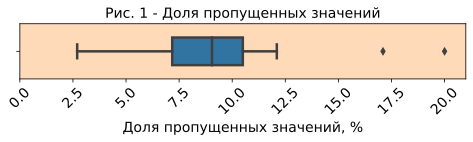

In [29]:
# задаем параметры для визуализации доли пропущенных значений с помощью boxplot
plt.figure(figsize = (8, 1))
h = sns.boxplot(x = 'Доля пропущенных значений',
            data = age_tenure_final,
            linewidth=2.5,
            width=0.5)
plt.xlim(0, 21)
plt.xlabel('Доля пропущенных значений, %',fontsize=14)
plt.title('Рис. 1 - Доля пропущенных значений', \
          fontsize = 14)
h.tick_params(axis='x', labelrotation=45, labelsize=14)
h.set_facecolor('peachpuff')
plt.show()

Никаких сильно выделяющихся значений в соотношении  распределения клиентов по возрасту для клиентов с заполненной и не заполненной информацией не выявлено. В основном для каждого возраста не заполняется от 7 до 11% значений длительности периода, в который человек является клиентом банка. Выбросы характерны только для клиентов возраста 75 лет (7 клиентов), 78 лет (4 клиента), 92 года (1 клиент). При общем количестве клиентов, о которых представлена информация в датасете (10_000), эти выбросы существенного влияния не оказывают. Для клиентов самых активных с точки зрения использования банковских услуг возрастов (29-42 года) количество незаполненных  значений примерно соответствует 9% от общего количества клиентов соответствующего возраста.

Таким образом:

  - соотнесение пропусков в столбце 'tenure' со значениями из столбцов 'geography' и 'age' не позволило сформировать понимание единственного пути заполнения пропусков пути

  - оставить пропуски для предстоящего машинного обучения нельзя. Удалять все строки с пропущенными значениями в столбце 'tenure' (9,09% всех данных) нецелесообразно, так как во всех остальных столбцах информация корректно заполнена, пропусков нет, будет потеряно 9% признаков из всех остальных столбцов

  - заполнить пропущенные значения нулем теоретически можно. В этом случае получаем некоторый перекос в пользу значения 'является клиентом банка 0 лет', по факту означающим, что это клиент, со дня заключения которым договора на банковское обслуживание прошло менее одного года. Гипотеза о том, что, с момента заключения договора информация не сразу отражается в первичной базе данных, представляется наиболее вероятной. Также можно было бы обратиться к банковским маркетологам и выяснить, были ли массированные рекламные кампании, направленные на привлечение новых клиентов в последний год. Возможно, привлекли так много клиентов, что информацию о сроке их сотрудничества с банком еще не внесли в исходную базу данных.

  - если бы была возможность обратиться к разработчикам и/или маркетологам и уточнить природу появления пропусков в столбце 'tenure', скорее всего было бы принято решение заполнить пропуски нулем. Остаются варианты заполнения пропусков медианным или средним значением по тем 91% значениям, которые есть в нашем распоряжении. В этом случае мы получим определенный перекос в сторону значения '5' столбца 'tenure'.

In [30]:
# рассчитаем медианное и среднее значение количества лет,
# которое человек является клиентом 'Бета-Банка'

print('Медианное значение = ', data['tenure'].median(), 'лет')
print('Среднее значение = ', round(data['tenure'].mean(), 3), 'лет')

Медианное значение =  5.0 лет
Среднее значение =  4.998 лет


Весьма редкий случай - медиана и среднее значение практически совпали.

Итак, обобщим возможные варианты заполнения пропусков:

 * заполнение нулевым значением - получаем перекос в сторону значения '0';

 * заполнение медианным или средним значением - получаем перекос в сторону значения '5' (более сильный, чем в сравнении с вариантом заполнения нулевым значением);

 * заполнение пропусков целочисленными значениями, выбранными наугад из диапазона от 0 до 10  - позволит избежать перекос в сторону того или иного значения признака 'tenure', однако наугад выбранные значения могут не соответствовать реальному сроку, который клиенты пользуются услугами банка;

 * заполнение значением 'минус единица' (-1) с изменением типа данных столбца на object и последующим кодированием как категориального признака.

 Заполним пропуски в столбце 'tenure' значением '-1'.

In [31]:
# проверим количество пропусков в столбце 'tenure' до заполнения пропусков
data.tenure.isna().sum()

909

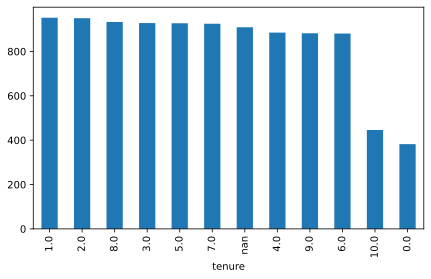

In [32]:
# визуализируем подсчет уникальных значений в столбце 'tenure'
# до заполнения пропусков
data.tenure.value_counts(dropna = False).plot(kind = 'bar')
plt.show()

In [33]:
# заполняем пропуски в столбце 'tenure'  значением -1
data['tenure'] = data['tenure'].fillna(-1)

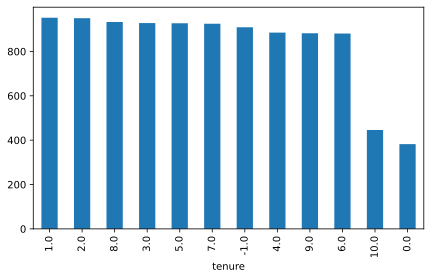

In [34]:
# визуализируем распределение клиентов банка по количеству лет
# их сотрудничества с банком после заполнения пропусков
data.tenure.value_counts(dropna = False).plot(kind = 'bar')
plt.show()

In [35]:
# проверим, остались ли пропуски в data.tenure
data.tenure.isna().sum()

0

In [36]:
# изменяем тип данных в столбце data.tenure на object
# для последующего кодирования в два этапа: сначала тип
# float64 заменим на int64 (чтобы быть уверенными, что значения округлены),
# затем изменим тип int64 на object
data.tenure = data.tenure.astype('int64')
data.tenure = data.tenure.astype(object)

In [37]:
# проверяем тип данных столбцов после изменения типа данных
# столбца data.tenure
data.dtypes

row_number            int64
customer_id           int64
surname              object
credit_score          int64
geography            object
gender               object
age                   int64
tenure               object
balance             float64
num_of_products       int64
has_cr_card           int64
is_active_member      int64
estimated_salary    float64
exited                int64
dtype: object

Тип данных в столбце 'tenure' успешно изменен на 'object'

In [38]:
# проверим, остались ли пропущенные значения в датасете
data.isna().sum()

row_number          0
customer_id         0
surname             0
credit_score        0
geography           0
gender              0
age                 0
tenure              0
balance             0
num_of_products     0
has_cr_card         0
is_active_member    0
estimated_salary    0
exited              0
dtype: int64

Для завершения предобработки осталось изменить тип данных в столбцах 'balance' и 'estimated_salary' с float64 на float32.

In [39]:
# меняем тип данных в столбцах 'balance' и 'estimated_salary'
# с float64 на float32
data[['balance', 'estimated_salary']] = \
data[['balance', 'estimated_salary']].astype('float32')

In [40]:
# проверим тип данных столбцов после проведенных изменений
print(data.dtypes)
print('')
print(data.dtypes.value_counts())

row_number            int64
customer_id           int64
surname              object
credit_score          int64
geography            object
gender               object
age                   int64
tenure               object
balance             float32
num_of_products       int64
has_cr_card           int64
is_active_member      int64
estimated_salary    float32
exited                int64
dtype: object

int64      8
object     4
float32    2
Name: count, dtype: int64


Тип данных в столбцах изменен в соответствии с программой исследования

**Выводы по 1.2 Общее ознакомление с данными и предварительная обработка данных**:

**(1)** проведено общее изучение данных датасета, не выявившее наличия серьезных ошибок

**(2)** проведена предварительная обработка данных, в том числе:

  - формат заголовков колонок приведен в соответствие стилю snake_case

  - проверка на явные и неявные дубликаты показала отсутствие дублирования информации в датасете

  - только в одном из 14-ти столбцов ('tenure') выявлены пропуски, заполненные значением '-1'

  - тип данных в столбцах 'balance' и 'estimated_salary' изменен с float64 на float32 в связи с тем, что в используемой для машинного обучения библиотеке sklearn используется тип данных float32

### **1.3 Кодирование категориальных признаков. Проверка на дисбаланс классов**

---

Для машинного обучения необходимо разделить исходный датасет на датасет, содержащий признаки, и датасет с целевым признаком.

**Целевым признаком** является столбец 'exited' (факт ухода клиента). Столбец включает значения '1' (клиент прекратил отношения с банком) и '0' (клиент продолжает пользоваться услугами банка).

С **признаками** все не так очевидно. Из 13-ти столбцов (признаков) три не имеют явной ценности для предсказания целевого признака:

   - 'row_number' (индекс строки в данных)

   - 'customer_id' (уникальный идентификатор клиента, - может быть весьма полезен для многих Data Science-исследований, но ровно никак не влияет на целевой признак текущего проекта)

   - 'surname' (фамилия, - если бы анализировались фамилии клиентов банка в XIX или начале XX века, длина фамилии могла бы указывать на принадлежность к аристократии и, действительно, влияла бы на целевой признак. К анализируемому датасету это не имеет отношение. Подтвердим данное утверждение проверкой фамилии с максимальным и минимальным количеством букв)

In [41]:
# вычислим количество букв в самой длинной фамилии
word_max_length = int(data.surname.astype(bytes).str.len().max())
print('Размер самой длинной фамилии:', word_max_length, 'букв')

# выведем на экран строчку датасета с информацией о клиенте
# с самой длинной фамилией
lengths_max = data.surname.str.len()
argmax = np.where(lengths_max == lengths_max.max())[0]
data.iloc[argmax]

Размер самой длинной фамилии: 23 букв


,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
2068,2069,15629338,Collingridge de Tourcey,658,Spain,Female,31,2,36566.960938,1,1,0,103644.976562,1


In [42]:
# вычислим количество букв в самой короткой фамилии
word_min_length = int(data.surname.astype(bytes).str.len().min())
print('Размер самой короткой фамилии:', word_min_length, 'букв')

# выведем на экран количество клиентов банка с самой короткой фамилией
lengths_min = data.surname.str.len()
argmin = np.where(lengths_min == lengths_min.min())[0]
print('Количество клиентов, длина фамилии которых включает две буквы:',
      data.surname.iloc[argmin].count(), 'человек')

Размер самой короткой фамилии: 2 букв
Количество клиентов, длина фамилии которых включает две буквы: 296 человек


In [43]:
# сгруппируем и посчитаем количество клиентов банка
# в зависимости от количества букв в их фамилии
surname = pd.DataFrame(data.surname.str.len().value_counts())
surname.columns = ['Количество клиентов банка']
surname

,Количество клиентов банка
surname,
6,1734
5,1566
7,1551
8,1543
4,1183
9,875
3,529
10,367
2,296


Вопреки ожиданиям 356 клиентов банка имеют длину фамилии с 11+ букв (3,56% от всех клиентов), у 62 клиентов длина фамилии составляет 15+ букв (0,62% от всех клиентов банка). Фамилия клиента с самой длинной фамилией, - Collingridge de Tourcey, - действительно, похожа на французскую аристократическую (хотя страна проживания Испания, но в условиях открытых границ внутри Европы это не имеет значения).

Изучим информацию о клиентах банка, длина фамилии которых составляет 17 (6 клиентов) и 19 (2 клиента) букв.

In [44]:
# выведем информацию о клиентах банка,
# длина фамилии которых равна 17 букв
lengths_17 = data.surname.str.len()
argmax_17 = np.where(lengths_17 == 17)[0]
data.iloc[argmax_17]

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
131,132,15718369,Kaodilinakachukwu,795,Germany,Female,33,9,130862.429688,1,1,1,114935.210938,0
558,559,15717046,Wentworth-Shields,741,Spain,Male,53,3,0.000000,2,1,1,38913.679688,0
2642,2643,15581548,Kaodilinakachukwu,637,Spain,Female,22,5,98800.000000,1,1,0,122865.546875,0
2681,2682,15576760,Onodugoadiegbemma,673,Germany,Male,36,5,73088.062500,2,0,0,196142.265625,0
5306,5307,15749638,Kaodilinakachukwu,605,France,Female,51,9,104760.820312,1,1,1,165574.546875,1
6176,6177,15604146,Kaodilinakachukwu,608,Germany,Female,38,8,103653.507812,2,1,1,137079.859375,0


In [45]:
# выведем информацию о клиентах банка,
# длина фамилии которых равна 19 букв
lengths_19 = data.surname.str.len()
argmax_19 = np.where(lengths_19 == 19)[0]
data.iloc[argmax_19]

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
3866,3867,15656840,Zikoranachukwudimma,547,France,Female,29,6,104450.859375,1,1,1,37160.281250,0
8673,8674,15707637,Zikoranachukwudimma,765,France,Female,56,1,0.000000,1,1,0,13228.929688,1


Фамилии клиентов, состоящие из 17 и 19 букв, не похожи на аристократические. Для того, чтобы принять окончательное решение об удалении столбца 'surname' из датасета с признаками, выведем информацию о клиентах банка, длина фамилии которых составляет 16 букв (19 клиентов)

In [46]:
# выведем информацию о клиентах банка,
# длина фамилии которых равна 16 букв
lengths_16 = data.surname.str.len()
argmax_16 = np.where(lengths_16 == 16)[0]
data.iloc[argmax_16]

,row_number,customer_id,surname,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,exited
739,740,15705639,Onyemauchechukwu,692,France,Female,28,8,95059.023438,2,1,0,44420.179688,0
747,748,15587535,Onyemauchechukwu,450,Spain,Female,46,5,177619.703125,1,1,0,54227.058594,0
906,907,15814275,Zikoranachidimma,685,France,Male,33,6,174912.718750,1,1,1,43932.539062,0
1018,1019,15602010,Zikoranaudodimma,850,Germany,Female,45,5,103909.859375,1,1,0,60083.109375,1
1810,1811,15592994,Zikoranachidimma,651,France,Female,65,-1,0.000000,2,1,1,190454.046875,0
2196,2197,15791700,Ugochukwutubelum,773,Germany,Male,47,2,118079.468750,4,1,1,143007.484375,1
3446,3447,15764654,Zikoranachidimma,649,France,Male,37,9,87374.882812,2,1,1,247.360001,0
4273,4274,15804787,Onyemauchechukwu,562,France,Male,75,5,87140.851562,1,1,1,39351.640625,0
4526,4527,15604818,Edmund la Touche,798,France,Male,34,9,154495.796875,1,1,0,191395.875000,0
5290,5291,15743490,Zikoranachidimma,795,Germany,Female,56,9,94348.937500,1,1,0,29239.289062,1


Из 19-ти клиентов банка с 16-тью буквами в фамилии фамилия только одного, - Edmund la Touche, - напоминает аристократическую, однако у настоящих аристократов прошлого фамилии были куда длиннее. Все остальные фамилии - скорее всего немецкие или финские, - для этих языков характерно наличие длинных слов. Названия наиболее известных дворянских родов Германии как правило включают большее, чем в рассмотренных выше выборках, количество букв.

  * Deutsches Adelsgeschlecht // Wikipedia. - URL: https://de.wikipedia.org/wiki/Kategorie:Deutsches_Adelsgeschlecht

В идеале было бы правильно обратиться в соответствующий отдел Бета-Банка и выяснить, ведется ли отдельный учет, кто из клиентов принадлежит к древним аристократическим родам. Учитывая географию местонахождения клиентов (Франция, Германия, Испания) это довольно важный вопрос. Если такая информация собирается, должен быть создан столбец с булевым типом данных 'Принадлежность к аристократическому роду'. Оставлять столбец 'surname' в том виде, как есть, нецелесообразно: при его кодировке с помощью OneHotEncoder будет создано большое число столбцов. Но конечный смысл состоит в том, что необходимо отличить аристократов от не-аристократов, а эту задачу качественно мы точно не сможем выполнить, если в банке не ведется соответствующий учет.

Таким образом, самым правильным решением будет **удалить из признаков столбец 'surname'**


In [47]:
# из исходного датасета выделим признаки
features = data.drop(['row_number',
                       'customer_id',
                       'surname',
                       'exited'], axis = 1)

features.shape

(10000, 10)

In [48]:
# из исходного датасета выделим целевой признак
target = data['exited']
target.shape

(10000,)

Прежде чем выделить обучающий и тестовый комплекты из features и target, закодируем значения столбцов 'geography' и 'gender' c помощью метода OneHotEncoder, подходящего для всех моделей, которые будут исследованы в последующих разделах проекта:

   - DecisionTreeClassifier

   - RandomForestClassifier

   - LogisticRegression

Прямое кодирование **OneHotEncoder** будет реализовано с учетом устранения **dummy-ловушки**

In [49]:
# для последующего контроля выведем первые пять строк
# датасета features
features.head()

,credit_score,geography,gender,age,tenure,balance,num_of_products,has_cr_card,is_active_member,estimated_salary
0,619,France,Female,42,2,0.000000,1,1,1,101348.882812
1,608,Spain,Female,41,1,83807.859375,1,0,1,112542.578125
2,502,France,Female,42,8,159660.796875,3,1,0,113931.570312
3,699,France,Female,39,1,0.000000,2,0,0,93826.632812
4,850,Spain,Female,43,2,125510.820312,1,1,1,79084.101562


In [50]:
# создаем объект OneHotEncoder, применив параметр drop = 'first'
# устраняем проблему dummy-ловушки
ohe = OneHotEncoder(sparse = False, drop='first')

In [51]:
# разделим features на два датасета, содержащие (1) числовые и
# (2) категориальные данные. Для кодировки предназначены только
# категориальные данные
features_numbers = features.drop(['geography', 'gender', 'tenure'], axis = 1)
print('Размер features_numbers:', features_numbers.shape)

features_category = features[['geography', 'gender', 'tenure']]
print('Размер features_category:', features_category.shape)

Размер features_numbers: (10000, 7)
Размер features_category: (10000, 3)


In [52]:
# создаем переменную features_ohe, в которую сохраняем
# обученную и трансформированную модель OneHotEncoder
features_ohe = ohe.fit_transform(features_category)
features_ohe

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [53]:
# выведем список новых колонок, полученных после обучения и трансформации
# данных датасета features_category в модели OneHotEncoder
ohe.get_feature_names_out()

array(['geography_Germany', 'geography_Spain', 'gender_Male', 'tenure_0',
       'tenure_1', 'tenure_2', 'tenure_3', 'tenure_4', 'tenure_5',
       'tenure_6', 'tenure_7', 'tenure_8', 'tenure_9', 'tenure_10'],
      dtype=object)

In [54]:
# сохраним результаты кодирования в датафрейме features_ohe
features_ohe = pd.DataFrame(features_ohe, columns=ohe.get_feature_names_out())
features_ohe.head()

,geography_Germany,geography_Spain,gender_Male,tenure_0,tenure_1,tenure_2,tenure_3,tenure_4,tenure_5,tenure_6,tenure_7,tenure_8,tenure_9,tenure_10
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
# объединим датасет с числовыми признаками features_numbers
# с датасетом features_ohe, содержащем закодированные данные
# категориальных признаков
features = features_numbers.merge(
    features_ohe,
    left_index = True,
    right_index = True
)

# приводим к стилю snake_case написание трех новых столбцов
features = clean_columns(features)

# выведем на экран размер обновленного датасета с признаками features
features.shape

(10000, 21)

In [56]:
# проверим корректность изменений, выведем первые пять строк
# датасета с признаками
features.head()

,credit_score,age,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_germany,geography_spain,gender_male,tenure_0,tenure_1,tenure_2,tenure_3,tenure_4,tenure_5,tenure_6,tenure_7,tenure_8,tenure_9,tenure_10
0,619,42,0.000000,1,1,1,101348.882812,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,608,41,83807.859375,1,0,1,112542.578125,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,502,42,159660.796875,3,1,0,113931.570312,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,699,39,0.000000,2,0,0,93826.632812,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,850,43,125510.820312,1,1,1,79084.101562,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Категориальные переменные, содержавшиеся в датасете с признаками features успешно закодированы с помощью OneHotEncoder с учетом устранения dummy-ловушки.

Проверим дисбаланс классов в целевом признаке target

In [57]:
# вычислим, какова доля признаков '0' и '1' в целевом признаке target
# до улучшения выборки
class_frequency_before = target.value_counts(normalize = True)
class_frequency_before

exited
0    0.7963
1    0.2037
Name: proportion, dtype: float64

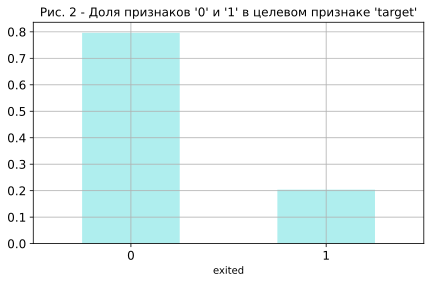

In [58]:
# визуализируем доли признаков '0' и '1' в целевом признаке target
# до улучшения выборки
class_frequency_before.plot(kind='bar',
                           fontsize = 12,
                           color = 'paleturquoise',
                           grid = True,
                           rot = 0)
plt.title('Рис. 2 - Доля признаков \'0\' и \'1\' в целевом признаке \'target\'', \
          fontsize = 12)
plt.show()

Целевой признак target в своем исходном виде не сбалансирован: 20% значений '1' (клиент прекратил использование продуктов банка), 80% значений '0' (клиент продолжает использовать продукты банка)

**Выводы по 1.3 Кодирование категориальных признаков. Проверка на дисбаланс классов**

**(1)** обосновано исключение из выборки с признаками столбцов 'row_number', 'customer_id', 'surname'

**(2)** с помощью прямого кодирования OneHotEncoder с учетом устранения dummy-ловушки проведено кодирование значений столбцов 'geography' и 'gender'

**(3)** проверен дисбаланс классов в целевом признаке target. Целевой признак target в своем исходном виде не сбалансирован: 20% значений '1' (клиент прекратил использование продуктов банка), 80% значений '0' (клиент продолжает использовать продукты банка)

### **1.4 Проверка на мультиколинеарность**

---

In [59]:
# создадим новый датасет для проверки признаков на мультиколинеарность,
# исклюbчив столбцы 'row_number', 'customer_id', 'surname'
data_multicollinear = \
    data.drop(['row_number', 'customer_id', 'surname'], axis = 1)

# проверим размеры датасета data_multicollinear
data_multicollinear.shape

(10000, 11)

Вычислим мультиколинеарность признаков с помощью функции correlation_report из модуля phik.report. Использование инструментов библиотеки phik позволяет рассчитать корреляцию между числовыми и категориальными признаками

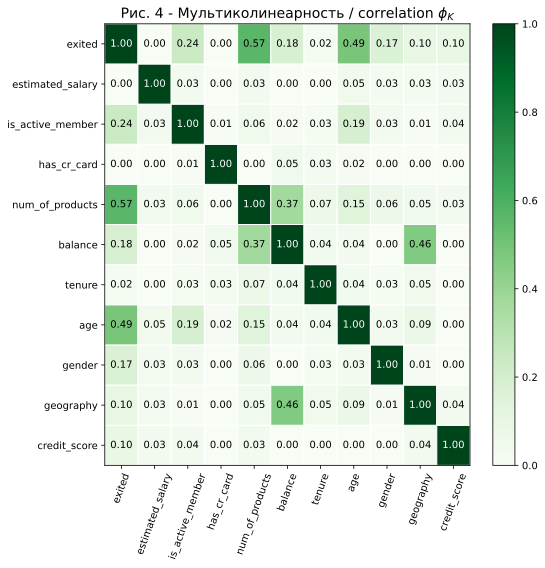

In [60]:
interval_cols = data_multicollinear.select_dtypes('number').columns.tolist()
phik_overview = data_multicollinear.phik_matrix(interval_cols=interval_cols)

plot_correlation_matrix(phik_overview.values,
                        x_labels=phik_overview.columns,
                        y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map="Greens",
                        title=r"Рис. 4 - Мультиколинеарность / correlation $\phi_K$",
                        fontsize_factor=1,
                        figsize=(8, 8))
plt.xticks(rotation=70)
plt.tight_layout()

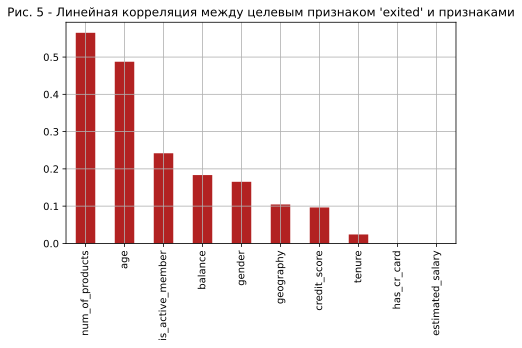

In [61]:
# изобразим на рисунке признаки в зависимости от уровня корреляции
# между ними и целевым признаком
phik_overview['exited'] \
    .sort_values(ascending=False) \
    [1:].plot(kind='bar', grid = True, color = 'firebrick')
plt.title('Рис. 5 - Линейная корреляция между целевым признаком \
\'exited\' и признаками', \
          fontsize = 12)
plt.show()

Отметим наличие средне-слабой корреляции между целевым признаком 'exited' и признаками 'age' и 'num_of_products' (0.49 и 0.57 соответственно). Среднеслабая линейная линейная корреляция наблюдается между признаками 'balance' и 'geography' (0.46), но это представляет меньший интерес, так как не затрагивает целевой признак.

**Выводы по 1.4 Проверка на мультиколинеарность**:

**(1)** проверка на мультиколинеарность не позволила выявить признаки с сильной линейной корреляцией. Наибольшее значение линейной корреляции выявлено между признаками 'exited' и 'age' (0.49), 'exited' и 'num_of_products' (0.57), 'balance' и 'geography' (0.46). Во всех указанных случаях степень линейной корреляции может быть обозначена как средне-слабая.

**(2)** поскольку в машинном обучении для достижения поставленной цели не предполагается использования линейных моделей, проверка на мультиколлинеарность носит вспомогательный, не обязательный характер. Несмотря на это в случае, если бы была выявлена сильная линейная корреляция между признаками, рассматривался бы вопрос об удалении одного или нескольких признаков

### **1.5 Отбор признаков для машинного обучения**

---

#### **1.5.1 Отбор признаков с помощью Mutual Information**

---


Функция mutual_info_regression позволяет измерить зависимоть между переменными. Значение Mutual Information близкое или равное нулю означает, что две величины независимы. Чем ближе значение Mutual Information, тем более зависимыми являются величины.

Mutual Information позволяет оценить, какие признаки дают наибольшее количество информации о целевом признаке. В ситуации когда доступно, например, 100 целевых признаков, далеко не все они значимы для обучения модели. Поэтому эксперты по машинному обучению подчеркивают, что выбор правильных признаков для машинного обучения является не просто одним из самых важных шагов. Он более важен, чем сама модель машинного обучения.

В обучающий набор должны войти те признаки, которые имеют наиболее сильную взаимосвязь с целевым признаком. Признаки, которые слабо или вообще не связаны с целевым признаком (Mutual Information равна или близка к нулю) из обучающего набора должны исключаться. Разумеется, с поправкой на то общее количество обучающих признаков, которым мы располагаем.

  * Feature Selection Based on Mutual Information Gain for Classification and Regression // Medium - Where good ideas find yuo. - URL: https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

  * Zhu, A. Select Features for Machine Learning Model with Mutual Information // Towards Data Science. - URL: https://towardsdatascience.com/select-features-for-machine-learning-model-with-mutual-information-534fe387d5c8

В процитированном выше исследовании 'Select Features for Machine Learning Model with Mutual Information' модель Decision Tree Classifier была обучена по трем наборам данных:

  * 1-я обучающая выборка: по всем признакам

  * 2-я обучающая выборка: по признакам, оценка Mutual Information которых выше 0.2

  *3-я обучающая выборка: по признакам, оценка Mutual Information которых ниже 0.2

Аналогичное исследование будет проведено в настоящем проекте. Пороговое значение, по которому будут определены признаки, входящие во 2-ю и 3-ю обучающую выборки, будут установлены по итогам изучения Mutual Information (п. 1.5.1) и SelektKBest (п. 1.5.2)

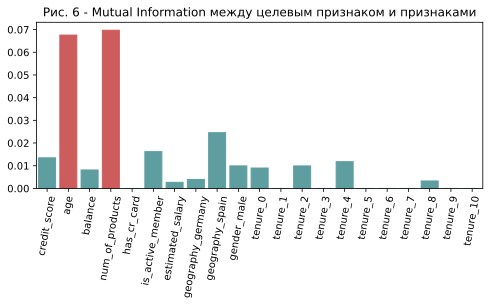

In [62]:
mi = mutual_info_regression(features, target, random_state = 1)

plt.figure(figsize = (8, 3))
ax = sns.barplot(x = features.columns.tolist(), y = mi)
plt.xticks(rotation = 80)
plt.title('Рис. 6 - Mutual Information между целевым признаком и признаками', \
          fontsize = 12)

for bar in ax.patches:
    if bar.get_height() > 0.04:
        bar.set_color('indianred')
    else:
        bar.set_color('cadetblue')

plt.show()

После изучения мультиколлинеарности (п. 1.4) мы лишь получили дополнительное подтвреждение, что наиболее сильная взаимосвязь между целевым признаком 'exited' наблюдается с признаками 'age' и 'num_of_products'. Вероятнее всего именно они войдут во вторую обучающую выборку. Порог составит > 0.04. Окончтаельное решение будет принято после проведения расчетов с помощью SelektKBest (п. 1.5.2).

**Вывод по 1.5.1 Отбор признаков с помощью Mutual Information**

**(1)** В результате расчета Mutual Information установлено, что два признака имеют уровень зависимости с целевым признаком в размере более 0.04 ('age' и 'num_of_products'). Несмотря на столь низкий порог планируется создание трех разных выборок с разным набором признаков и тестировании их на предмет лучшего значения f1_score на лучшей обученной модели.

#### **1.5.2 Отбор признаков с помощью алгоритма SelektKBest библиотеки sklearn и модуля feature_selection**

---


Алгоритм SekekеKBest выбирает заданное пользователем число наиболее важных признаков (k). Алгоритм проводит оценку с использованием Mutual Information (функция mutual_info_regression)

In [63]:
# Для отбора признаков с помощью алгоритма SelektKBest
#создадим копии датасетов features и target
features_copy = features.copy()
target_copy = target.copy()

In [64]:
# кодируем столбцы с категориальными данными датасета features_copy,
# используя OrdinalEncoder,
# т.к. SelektKBest работает только с закодированными числовыми данными;
# обучаем и трнасформируем данные объекта OrdinalEncoder
cat_columns = features_copy.select_dtypes('category').columns
features_copy[cat_columns] = OrdinalEncoder(
    ).fit_transform(features_copy[cat_columns])

# выведем на экран информацию о количестве признаков
# в датасете features_copy (количестве столбцов)
features_copy.shape

(10000, 21)

In [65]:
# создаем переменную feature_selector, которая будет являться
# объектом SelektKBest, в которую передаем название
# алгоритма поиска важнейшего признака;
# указываем, сколько именно важнейших признаков необходимо найти
feature_selector = SelectKBest(mutual_info_regression, k=2)
features_new = feature_selector.fit_transform(features_copy, target_copy)

# выведем на экран информацию о количестве признаков
# в датасете features_new после выявления с помощью SelektKBest
# наиболее важных признаков
features_new.shape

(10000, 2)

In [66]:
# выведем на экран названия важнейших признаков,
# выявленных с помощью SelektKBest
feature_selector.get_feature_names_out()

array(['age', 'num_of_products'], dtype=object)

**Выводы по 1.5.2 Отбор признаков с помощью алгоритма SelektKBest библиотеки sklearn и модуля feature_selection**:

**(1)** в результате применения алгоритма SelektKBest были выявлены два важнейших признака из всей совокупности признаков: 'age' и 'num_of_products'

**(2)** результаты применения SelektKBest одидаемо совпали и подтвердили выводы, полученные в п. 1.5.1 по итогам отбора признаков с помощью Mutual Information. Для SelektKBest мы могли указать число искомых важнейших признаков, превышающее два. Однако анализ, проведенный с помощью Mutual Information, исследвоание мультиколинеарности позволили установить, что из всей совокупности со значительным отрывом лидируют два признка: 'age' и 'num_of_products'

**Выводы по 1.5 Отбор признаков для машинного обучения**:

**(1)** в результате проведенного отбора признаков для машинного обучения с использованием Mutual Information и SelektKBest из всей совокупности признаков выявлены два важнейших: 'age' и 'num_of_products'

**(2)** обучение моделей будет проведено на трех обучающих выборках:

  * 1-я обучающая выборка: включает все признаки
  
  *  2-я обучающая выборка: включает признаки 'age' и 'num_of_products'

  * 3-я обучающая выборка включает все признаки, **кроме** 'age' и 'num_of_products'

### **1.6  Разделение выборки на датасет с признаками и датасет с целевым признаком**

Следующим шагом станет разделение features и target на обучающий и тестовый комплекты. Стратификация будет проведена, однако масштабирование и устранение дисбаланса классов на этом этапе проводиться не будут. Первоначально модели будут обучены на выборке без улучшения (2-й этап исследования), и только после этого к выборкам будет применено масштабирование и балансировка методами upsampling и downsampling и повторное обучение моделей на улучшенных выборках

In [67]:
# с помощью метода train_test_split
# выделим обучающий и тестовый комплекты
features_train, features_test, \
target_train, target_test = train_test_split(
    features,
    target,
    test_size = 0.25,
    stratify = target
)

print('Обучающая выборка (признаки):', features_train.shape)
print('Обучающая выборка (целевой признак):', target_train.shape)
print('')
print('Тестовая выборка (признаки):', features_test.shape)
print('Тестовая выборка (целевой признак):', target_test.shape)

Обучающая выборка (признаки): (7500, 21)
Обучающая выборка (целевой признак): (7500,)

Тестовая выборка (признаки): (2500, 21)
Тестовая выборка (целевой признак): (2500,)


Обучающий и тестовый комплект для обучения моделей на выборках без масштабирования и  с наличием дисбаланса классов готов. Но это только первый этап подготовки тренировочных комплектов. На основе результатов п. 1.5 создадим три тренировочные выборки:

 * features_train_1 (включает все признаки из features)

 * features_train_2 (включает два признака из features: 'age' и 'num_of_products')

 * features_train_3 (включает девять признаков из features, кроме 'age' и 'num_of_products')

Целевой обучающий признак для всех трех вариантов обучающей выборки будет один - target_train.

**Во втором разделе** три модели (Decision Tree Classifier, Random Forest Regressor, Logistic Regressor) будут протестированы каждая на трех комплектах.

**Для третьего раздела** будет выполнено масштабирование и балансировка датасетов features_train и target_train с последующим формированием трех вариантов обучающего датасета с признаками (все признаки; два признака; девять признаков).

Тестовые комплекты features_test и target_test не будут подвергаться ни масштабированию, ни балансировке. С их помощью лучшая модель будет проверена **в четвертом разделе**.

In [68]:
# создаем первый обучающий датасет, включающий все признаки
# и выводим для контроля размер обучающего датасета
features_train_1 = features_train.copy()
features_train_1.shape

(7500, 21)

In [69]:
# выведем первые пять строк первого обучающего датасета
features_train_1.head()

,credit_score,age,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_germany,geography_spain,gender_male,tenure_0,tenure_1,tenure_2,tenure_3,tenure_4,tenure_5,tenure_6,tenure_7,tenure_8,tenure_9,tenure_10
8945,542,35,174894.531250,1,1,1,22314.550781,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
392,648,46,127209.000000,2,1,0,77405.953125,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
597,646,39,111574.406250,1,1,1,30838.509766,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9750,708,51,70754.179688,1,1,1,92920.039062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3117,721,43,88798.343750,1,0,0,45610.628906,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [70]:
# создаем второй обучающий датасет, включающий два признака
# и выводим для контроля размер обучающего датасета
features_train_2 = features_train[['age', 'num_of_products']]
features_train_2.shape

(7500, 2)

In [71]:
# выведем первые пять строк второго обучающего датасета
features_train_2.head()

,age,num_of_products
8945,35,1
392,46,2
597,39,1
9750,51,1
3117,43,1


In [72]:
# создаем третий обучающий датасет, включающий восемь признаков
# и выводим для контроля размер обучающего датасета
features_train_3 = features_train.drop(['age', 'num_of_products'], axis = 1)
features_train_3.shape

(7500, 19)

In [73]:
# выведем первые пять строк третьего обучающего датасета
features_train_3.head()

,credit_score,balance,has_cr_card,is_active_member,estimated_salary,geography_germany,geography_spain,gender_male,tenure_0,tenure_1,tenure_2,tenure_3,tenure_4,tenure_5,tenure_6,tenure_7,tenure_8,tenure_9,tenure_10
8945,542,174894.531250,1,1,22314.550781,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
392,648,127209.000000,1,0,77405.953125,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
597,646,111574.406250,1,1,30838.509766,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9750,708,70754.179688,1,1,92920.039062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3117,721,88798.343750,0,0,45610.628906,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Вывод по 1.6  Разделение выборки на датасет с признаками и датасет с целевым признаком**:


**(1)** датасет с признаками features и датасет с целевым признаком target разделены на обучающий и тестовый комплекты. Размер тестовой выборки составил 25%. Проведена стратификация по целевому признаку target

**(2)** с целью исследования влияния наиболее важных признаков на результат обучения модели сформировано три варианта обучающего датасета:

 * features_train_1 включает все признаки

 * features_train_2 включает два признака (самые важные признаки)

 * features_train_3 включает девять признаков (все признаки кроме двух самых важных)

**ВЫВОДЫ по 1 Подготовка данных**:

**(1)** проведено общее изучение данных датасета, не выявившее наличия серьезных недостатков

**(2)**данные предобработаны и подготовлены для машинного обучения, в том числе проведено кодирование категориальных признаков

**(3)** проведена оценка дисбаланса классов в целевом признаке target. Данные не сбалансированы: на показатель '0' приходится 80% значений, на показатель '1' – 20% значений.

**(4)** проведена проверка данных датасета на мультиколинеарность, не выявившая наличие сильной линейной корреляции между признаками

**(5)** обосновано исключение из обучающей выборки признаков 'row_number', 'customer_id', 'surname', не имеющих никакой объективной связи с целевым признаком 'exited'

**(6)** проведен отбор важнейших признаков для машинного обучения с точки зрения их влияния на целевой признак. Таковыми являются 'age' и 'num_of_products'. Принято решение обучить модели на трех вариантах обучающих выборок: включающей все признаки; включающей признаки 'age' и 'num_of_products'; включающей все признаки, кроме 'age' и 'num_of_products'

**(7)** исходный датасет разделен на датасет с признаками и датасет с целевым признаком, сформированы обучающий и тестовый комплекты для машинного обучения с учетом стратификации. Размер тестовой выборки составил 25%

**(8)** с целью исследования влияния наиболее важных признаков на результат обучения модели сформировано три варианта обучающего датасета: features_train_1 включает все признаки; features_train_2, – включает два признака (самые важные признаки); features_train_3 , – включает девятнадцать признаков (все признаки кроме двух самых важных)

## **2 Обучение моделей без учёта дисбаланса и масштабирования**

---

### **2.1 Поиск лучшей модели классификации деревом решений**

---

In [74]:
# создадим словарь датасетов, включающий три варианта
# обучающей выборки: features_train_1, features_train_2, features_train_3
features_list = [features_train_1,
                 features_train_2,
                 features_train_3]

In [75]:
# объявляем модель классификации деревом решений
model_tree = DecisionTreeClassifier(random_state = 1)

In [76]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_tree = {
    'criterion': ['entropy'],
    'max_depth': range(1, 31, 2),
    'max_features': range(1, 7, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    }

In [77]:
# объявляем объект GridSearchCV,
grid_model_tree = GridSearchCV(
    model_tree,
    params_model_tree,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [78]:
%%time

# в цикле обучаем GridSearchCV-модель с помощью функции fit()
# на датасетах из features_dict
for dataset in tqdm(features_list):
    grid_model_tree.fit(dataset, target_train)
    best_tree_model = grid_model_tree.best_estimator_
    print(best_tree_model)
    print(grid_model_tree.best_params_)
    print('f1_score лучшей модели =', round(grid_model_tree.best_score_, 4))
    probabilities = (
        best_tree_model.predict_proba(dataset))[:, 1]
    roc_auc_tree = roc_auc_score(
        target_train, probabilities)
    print('roc-auc лучшей модели =', round(roc_auc_tree, 4))
    print('')

  0%|          | 0/3 [00:00<?, ?it/s]

DecisionTreeClassifier(criterion='entropy', max_depth=15, max_features=5,
                       min_samples_leaf=5, min_samples_split=3, random_state=1)
{'criterion': 'entropy', 'max_depth': 15, 'max_features': 5, 'min_samples_leaf': 5, 'min_samples_split': 3}
f1_score лучшей модели = 0.512
roc-auc лучшей модели = 0.9363

DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=3,
                       min_samples_leaf=5, min_samples_split=3, random_state=1)
{'criterion': 'entropy', 'max_depth': 5, 'max_features': 3, 'min_samples_leaf': 5, 'min_samples_split': 3}
f1_score лучшей модели = 0.5203
roc-auc лучшей модели = 0.8248

DecisionTreeClassifier(criterion='entropy', max_depth=29, max_features=5,
                       min_samples_leaf=3, min_samples_split=3, random_state=1)
{'criterion': 'entropy', 'max_depth': 29, 'max_features': 5, 'min_samples_leaf': 3, 'min_samples_split': 3}
f1_score лучшей модели = 0.2773
roc-auc лучшей модели = 0.937

CPU times: user 5.69 s, sy

### **2.2 Поиск лучшей модели классификации случайного леса**

---

In [79]:
# объявляем модель классификации случайного леса,
model_forest = RandomForestClassifier(random_state = 1)

In [80]:
# создаем словарь с гиперпараметрами
params_model_forest = {
    'criterion': ['entropy'],
    'max_depth': range(1, 17, 2),
    'max_features': range(1, 5, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    'n_estimators': range(1, 71, 10),
    }

In [81]:
# объявляем объект GridSearchCV,
grid_model_forest = GridSearchCV(
    model_forest,
    params_model_forest,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [82]:
%%time

# в цикле обучаем GridSearchCV-модель с помощью функции fit()
# на датасетах из features_list
for dataset in tqdm(features_list):
    grid_model_forest.fit(dataset, target_train)
    best_forest_model = grid_model_forest.best_estimator_
    print(best_forest_model)
    print(grid_model_forest.best_params_)
    print('f1_score лучшей модели =', round(grid_model_forest.best_score_, 4))
    probabilities = (
        best_forest_model.predict_proba(dataset))[:, 1]
    roc_auc_forest = roc_auc_score(
        target_train, probabilities)
    print('roc-auc лучшей модели =', round(roc_auc_forest, 4))
    print('')

  0%|          | 0/3 [00:00<?, ?it/s]

RandomForestClassifier(criterion='entropy', max_depth=15, max_features=3,
                       min_samples_split=5, n_estimators=61, random_state=1)
{'criterion': 'entropy', 'max_depth': 15, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 61}
f1_score лучшей модели = 0.5322
roc-auc лучшей модели = 0.9873

RandomForestClassifier(criterion='entropy', max_depth=5, max_features=1,
                       min_samples_leaf=5, min_samples_split=3, n_estimators=1,
                       random_state=1)
{'criterion': 'entropy', 'max_depth': 5, 'max_features': 1, 'min_samples_leaf': 5, 'min_samples_split': 3, 'n_estimators': 1}
f1_score лучшей модели = 0.5398
roc-auc лучшей модели = 0.8207

RandomForestClassifier(criterion='entropy', max_depth=13, max_features=3,
                       min_samples_split=9, n_estimators=1, random_state=1)
{'criterion': 'entropy', 'max_depth': 13, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_split': 9, 'n_estimators': 1

### **2.3 Поиск лучшей модели логистической регрессии**

---

In [83]:
# объявляем модель логистической регрессии
model_logreg = LogisticRegression(random_state = 1)

In [84]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_logreg = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': range(100, 5001, 100)
    }

In [85]:
# объявляем обект GridSearchCV
grid_model_logreg = GridSearchCV(
    model_logreg,
    params_model_logreg,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [86]:
%%time

# в цикле обучаем GridSearchCV-модель с помощью функции fit()
# на датасетах из features_list
for dataset in tqdm(features_list):
    grid_model_logreg.fit(dataset, target_train)
    best_logreg_model = grid_model_logreg.best_estimator_
    print(best_logreg_model)
    print(grid_model_logreg.best_params_)
    print('f1_score лучшей модели =', round(grid_model_logreg.best_score_, 4))
    probabilities = (
        best_logreg_model.predict_proba(dataset))[:, 1]
    roc_auc_logreg = roc_auc_score(
        target_train, probabilities)
    print('roc-auc лучшей модели =', round(roc_auc_logreg, 4))
    print('')

  0%|          | 0/3 [00:00<?, ?it/s]

LogisticRegression(max_iter=200, random_state=1, solver='newton-cg')
{'max_iter': 200, 'solver': 'newton-cg'}
f1_score лучшей модели = 0.3233
roc-auc лучшей модели = 0.7684

LogisticRegression(max_iter=500, random_state=1, solver='saga')
{'max_iter': 500, 'solver': 'saga'}
f1_score лучшей модели = 0.0745
roc-auc лучшей модели = 0.7342

LogisticRegression(random_state=1, solver='newton-cg')
{'max_iter': 100, 'solver': 'newton-cg'}
f1_score лучшей модели = 0.0453
roc-auc лучшей модели = 0.6816

CPU times: user 36.1 s, sys: 8.05 s, total: 44.2 s
Wall time: 43min 11s


**ВЫВОДЫ по 2 Обучение моделей без учёта дисбаланса и масштабирования**

Во втором разделе проведено тестирование моделей Decision Tree Classifier, Random Forest Classifier, Logistic Regression на тренировочной выборке, данные которой не были масштабированы и сбалансированы.

Особо необходимо обратить внимание, что в ходе тестирования моделей в циклах каждая из трех лучших моделей не сохранялась отдельно - это не требуется, так как в следующем 3-м разделе будут тестироваться модели с данными, котоыре будут масштабированы и сбалансированы. Ожидается, что метрика f1_score будет выше. По этой причине в 3-м разделе каждая протестированная модель будет сохраняться отдельно, что позволит провести финальное тестирование лучшей модели в 4-м разделе.

Целевой признак во всех случаях был один и тот же. Датасет с признаками был представлен в трех вариантах:

 * features_train_1 включает все признаки

 * features_train_2 включает два признака (самые важные признаки)

 * features_train_3 включает девятнадцать признаков (все признаки кроме двух самых важных)

Результаты проведенных экспериментов по выявлению лучшей модели представлены в таблице и на рисунке 7

In [221]:
models_unbalanced = pd.DataFrame(
    {'1': ['Tree (все признаки)', 0.512, 0.9963],
     '2': ['Tree (два признака)', 0.5203, 0.8248],
     '3': ['Tree (19 признаков)', 0.2773, 0.937],
     '4': ['Forest (все признаки)', 0.5322, 0.9873],
     '5': ['Forest (два признака)', 0.5398, 0.8207],
     '6': ['Forest (19 признаков)', 0.2534, 0.7562],
     '7': ['LogReg (все признаки)', 0.3233, 0.7684],
     '8': ['LogReg (два признака)', 0.0745, 0.7342],
     '9': ['LogReg (19 признаков)', 0.0453, 0.6816],
    }
)

models_unbalanced = models_unbalanced.T
models_unbalanced.columns = ['Модель', 'f1_score', 'roc_auc_score']
models_unbalanced

,Модель,f1_score,roc_auc_score
1,Tree (все признаки),0.512,0.9963
2,Tree (два признака),0.5203,0.8248
3,Tree (19 признаков),0.2773,0.937
4,Forest (все признаки),0.5322,0.9873
5,Forest (два признака),0.5398,0.8207
6,Forest (19 признаков),0.2534,0.7562
7,LogReg (все признаки),0.3233,0.7684
8,LogReg (два признака),0.0745,0.7342
9,LogReg (19 признаков),0.0453,0.6816


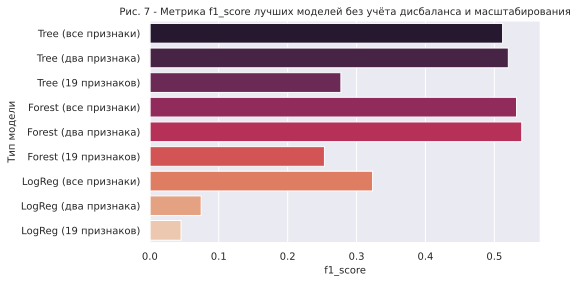

In [222]:
b = sns.barplot(data = models_unbalanced,
            x = 'f1_score',
            y = 'Модель',
            palette = 'rocket')
sns.set(rc={'figure.figsize':(4,4)})
b.axes.set_title('Рис. 7 - Метрика f1_score лучших моделей \
без учёта дисбаланса и масштабирования',fontsize=10)
b.set_xlabel('f1_score',fontsize=10)
b.set_ylabel('Тип модели',fontsize=10)
b.tick_params(labelsize=10)
plt.show()

**(1)** Самый лучший результат показала модель классификации случайного леса Random Forest Classifier, f1_score которой **на тренировочной выборке:** **0.5842**. Для лучшей модели характерны следующие гиперпараметры:

 - 'criterion': 'entropy'
 - 'max_depth': 15
 - 'max_features': 3
 - 'min_samples_leaf': 1
 - 'min_samples_split': 7
 - 'n_estimators': 41

 Лучшая модуль была получена при обучении на всей совокупонсти признаков (features_train_1)

**(2)** количество признаков в обучающей выборке значимо влияет на метрику f1_score. Для всех рассмотренных моделей тестирование на выборке, включающей малозначимые признаки позволяет получить самое низкое значение метрики f1_score. Значение метрики f1_score на обучающей выборке, состоящей всего из двух важнейших признаков лишь немного проигрывает значению метрики, полученной на всей совокупности признаков (для моделей классификации деревом решений и случайного леса). Но здесь важно понимать три момента:

  - два важнейших признака на самом деле важнейшими названы формально, - степень их влияния на целевой признак, как было убелительно доказано  в п. 1.5.1 невелика. Они лишь выделяются на фоне остальных признаков, и все

  - вполне вероятно, что если бы количество наиболее важных признаков мы бы увеличили до трех или четырех, - на выборке, включающей только важнейшие признаки, мог бы быть получен размер метрики f1_score, практически сопоставимый или равный метрике f1_score на полной совокупности признаков (относится к моделям деревьев). Но в связи с тем, что следующие за самыми важными признаки отличаются совсем небольшим влиянием на целевой признак, мы не будем открывать новую ветку тестирования

**(3)** на выборке с не масштабированными и несбалансированными данными лучшее значение модели классификации деревом решений незначительно уступает лучшему значению модели классификации случайного леса, зато в десятки раз превосходит ее в скорости обучения

## **3 Обучение моделей с учетом масштабирования и устранения дисбаланса классов**

---

### **3.1 Масштабирование данных тренировочного комплекта**

---

Масштабирование функций в машинном обучении является одним из наиболее важных шагов во время предварительной обработки данных перед созданием модели машинного обучения.

Алгоритм машинного обучения просто "видит" число — если есть большая разница в диапазоне, скажем, одни признаки измеряются в основном в десятках, а другие в десятках тысяч, модель делает базовое предположение, что числа с более высокими значениями имеют какое-то превосходство. Таким образом, превосходящие числовые значения в одном из признаков в сравнении с другими признаками значимо искажают результаты машинного обучения.

 * Roy, B. All about Feature Scaling / B. Roy // Towards Data Science. - URL: https://towardsdatascience.com/all-about-feature-scaling-bcc0ad75cb35

Данные, представленыне в датасете, могут содержать атрибуты со смесью весов. Многие методы машинного обучения более эффективны, если атрибуты данных имеют одинаковый масштаб. Масштабирование данных в первую очередь важно для линейных моделей, вычисляющих расстояния между точками.

Общее правило таково: в алгоритмах машинного обучения, если значения объектов ближе друг к другу, есть шансы, что алгоритм будет обучен хорошо и быстрее. Напротив, если алгоритм машинного обучения работает  с данными, в которых точки данных или значения объектов между разными признаками имеют большие различия друг с другом, алгоритму потребуется больше времени для понимания данных, а точность будет ниже.

 * Verma, Y. Why Data Scaling is important in Machine Learning & How to effectively do it / Y. Verma // Analytics India Magazine -  Artificial Intelligence, Data Science, Machine Learning. - URL: https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/

 * Масштабирование данных для машинного обучения в Python с помощью Scikit-Learn // Машинное обучение. - URL: https://machinelearningmastery.ru/rescaling-data-for-machine-learning-in-python-with-scikit-learn/


 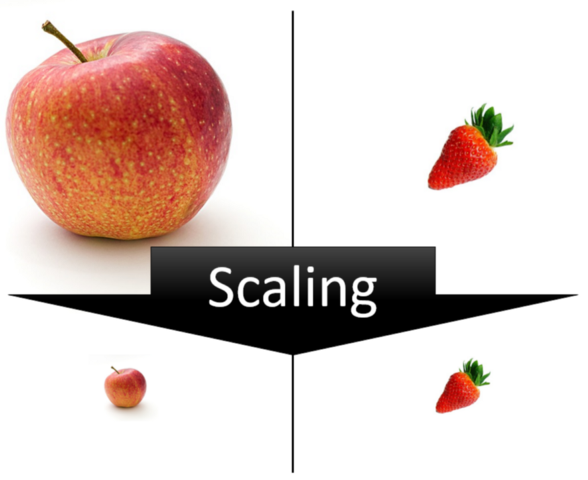

Ранее были созданы три датасета с признаками:

 * features_train_1 (включает все признаки)
 * features_train_2 (включает два важнейших признака)
 * features_train_3 (включает девятнадцать признаков, а именно: все за исключением важнейших)

 Принятое решение тестировать модели по этим трем враиантам необходимо скорректировать. Поскольку в рамках 3-го раздела будет проведено исследование нескольких алгоритмов балансировки классов, для выполнения первоначально намеченной прогарммы потребуется провести 36 тестов. Это чрезвычайно трудоемкая задача для реализуемого проекта. По итогам тестирования трех вариантов датасета с признаками на несбалансирвоанной выборке был сделан важный вывод о том, что тестирование выборки с малозначимыми признаками лишено смысла. Отдельное тестирование выборки с немногочисленными важнейшими признаками на самом деле представляет практический интерес, но для этого необходимо, чтобы уровень влияния этих рпизнаков на целевой признак был выше того, котоырй был выявлен в п. 1.5.1.

 В связи с этим далее по каждому алгоритму три выбранные для исследвоания модели будут тестироваться только один раз на выборке, включающей всю совокупность признаков features_train_1

In [89]:
# выведем первые пять строк датасета с признаками перед масштабированием
features_train_1.head()

,credit_score,age,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_germany,geography_spain,gender_male,tenure_0,tenure_1,tenure_2,tenure_3,tenure_4,tenure_5,tenure_6,tenure_7,tenure_8,tenure_9,tenure_10
8945,542,35,174894.531250,1,1,1,22314.550781,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
392,648,46,127209.000000,2,1,0,77405.953125,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
597,646,39,111574.406250,1,1,1,30838.509766,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9750,708,51,70754.179688,1,1,1,92920.039062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3117,721,43,88798.343750,1,0,0,45610.628906,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [90]:
# выведем информацию о размере датасета перед масштабированием
features_train_1.shape

(7500, 21)

In [91]:
# создаем объект StandardScaler
scaler = StandardScaler()

Обучаем и трансформируем созданный объект scaler на датасете features_train_1, включающим все признаки

In [92]:
scaler.fit(features_train_1)

StandardScaler()

In [93]:
features_train_1 = scaler.transform(features_train_1)

In [94]:
# выведем информацию о размере датасета перед масштабированием
features_train_1.shape

(7500, 21)

**Выводы по 3.1 Масштабирование данных тренировочного комплекта**:

**(1)** данные обучаюшей выборки features_train_1 масштабированы с помощью объекта StandardScaler

### **3.2 Обучение моделей с учетом устранения дисбаланса классов методом SMOTE**

---

#### **3.2.1 Устранение дисбаланса методом SMOTE**

---

In [95]:
# устраняем дисбаланс классов в обучающем комплекте
# методом SMOTE
features_smote, target_smote = SMOTE().fit_resample(
    features_train_1, target_train)
print('Оригинальный датасет:', sorted(Counter(target_train).items()))
print('Сбалансированный датасет:', sorted(Counter(target_smote).items()))

Оригинальный датасет: [(0, 5972), (1, 1528)]
Сбалансированный датасет: [(0, 5972), (1, 5972)]


In [220]:
# визуализируем результаты устранения дисбаланса классов
sns.scatterplot(
    x=features_smote[:,0],
    y=features_smote[:,1],
    color='r',
    label='sampled')
sns.scatterplot(
    x=features_train_1[:,0],
    y=features_train_1[:,1],
    hue=target_train)
sns.set(rc={'figure.figsize':(7,4)})
plt.title('Рис. 8 - Балансировка классов тестового комплекта методом SMOTE',
          fontsize=12)

plt.tight_layout()
plt.show()

По рисунку 8 можно заметить, что с помощью метода SMOTE были добавлены значения, позволяющие сбалансирвоать выборку, преимущественно по внешней границе признака '1'

#### **3.2.2 Обучение модели классификации деревом решений на выборке, сбалансированной методом SMOTE**

---

In [97]:
# объявляем модель классификации деревом решений
model_tree_2 = DecisionTreeClassifier(random_state = 1)

In [98]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_tree_2 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 31, 2),
    'max_features': range(1, 7, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    }

In [99]:
# объявляем объект GridSearchCV
grid_model_tree_2 = GridSearchCV(
    model_tree_2,
    params_model_tree_2,
    cv = 5,
    scoring = 'f1',
    refit=True,
    n_jobs= -1)

In [100]:
%%time

# обучаем модель с помощью функции fit()
grid_model_tree_2.fit(features_smote, target_smote)

CPU times: user 2.14 s, sys: 184 ms, total: 2.32 s
Wall time: 48.5 s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 31, 2),
                         'max_features': range(1, 7, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2)},
             scoring='f1')

In [101]:
# сохраним лучшую модель DecisionTreeClassifier
# в переменную best_tree_model_2
best_tree_model_2 = grid_model_tree_2.best_estimator_
best_tree_model_2

DecisionTreeClassifier(criterion='entropy', max_depth=17, max_features=5,
                       min_samples_split=3, random_state=1)

In [102]:
# выведем на экран гиперпараметры лучшей модели
# классификации деревом решений
grid_model_tree_2.best_params_

{'criterion': 'entropy',
 'max_depth': 17,
 'max_features': 5,
 'min_samples_leaf': 1,
 'min_samples_split': 3}

In [103]:
# вычислим f1_score лучшей модели
# классификации деревом решений
print('f1_score лучшей модели на выборке features_smote =',
      round(grid_model_tree_2.best_score_, 4))

f1_score лучшей модели на выборке features_smote = 0.8334


In [104]:
# вычислим метрику roc_auc лучшей модели
# классификации деревом решений
probabilities_2 = (
    best_tree_model_2.predict_proba(features_smote))[:, 1]

roc_auc_tree_2 = roc_auc_score(
    target_smote, probabilities_2)
print('roc-auc на выборке features_smote =',
      round(roc_auc_tree_2, 4))

roc-auc на выборке features_smote = 0.988


#### **3.2.3 Обучение модели классификации случайного леса на выборке, сбалансированной методом SMOTE**

---

In [105]:
# объявляем модель классификации случайного леса,
model_forest_2 = RandomForestClassifier(random_state = 1)

In [106]:
# создаем словарь с гиперпараметрами
params_model_forest_2 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 17, 2),
    'max_features': range(1, 5, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    'n_estimators': range(1, 71, 10),
    }

In [107]:
# объявляем объект GridSearchCV
grid_model_forest_2 = GridSearchCV(
    model_forest_2,
    params_model_forest_2,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [108]:
%%time

# обучаем модель с помощью функции fit()
grid_model_forest_2.fit(features_smote, target_smote)

CPU times: user 20.2 s, sys: 3 s, total: 23.2 s
Wall time: 17min 23s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 17, 2),
                         'max_features': range(1, 5, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2),
                         'n_estimators': range(1, 71, 10)},
             scoring='f1')

In [109]:
# сохраним лучшую модель RandomForestClassifier
# в переменную best_forest_model_2
best_forest_model_2 = grid_model_forest_2.best_estimator_
best_forest_model_2

RandomForestClassifier(criterion='entropy', max_depth=15, max_features=3,
                       min_samples_split=3, n_estimators=61, random_state=1)

In [110]:
# выведем на экран гиперпараметры лучшей модели
# классификации случайного леса
grid_model_forest_2.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'max_features': 3,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 61}

In [111]:
# вычислим f1_score лучшей модели
# классификации случайного леса
print('f1_score лучшей модели на выборке features_smote =',
      round(grid_model_forest_2.best_score_, 4))

f1_score лучшей модели на выборке features_smote = 0.8912


In [112]:
# вычислим метрику roc_auc лучшей модели
# классификации случайного леса
probabilities_2 = (
    best_forest_model_2.predict_proba(features_smote))[:, 1]

roc_auc_forest_2 = roc_auc_score(
    target_smote, probabilities_2)
print('roc-auc на выборке features_smote =',
      round(roc_auc_forest_2, 4))

roc-auc на выборке features_smote = 0.9935


#### **3.2.4 Обучение модели логистической регрессии на выборке, сбалансированной методом SMOTE**

---

In [113]:
# объявляем модель логистической регрессии
model_logreg_2 = LogisticRegression(random_state = 1)

In [114]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_logreg_2 = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear'],
    'max_iter': range(100, 5001, 100)
    }

In [115]:
# объявляем объект GridSearchCV
grid_model_logreg_2 = GridSearchCV(
    model_logreg_2,
    params_model_logreg_2,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [116]:
%%time

# обучаем модель с помощью функции fit()
grid_model_logreg_2.fit(features_smote, target_smote)

CPU times: user 797 ms, sys: 87 ms, total: 884 ms
Wall time: 18.8 s


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1), n_jobs=-1,
             param_grid={'max_iter': range(100, 5001, 100),
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='f1')

In [117]:
# сохраним лучшую модель LogisticRegression
# в переменную best_logreg_model_2
best_logreg_model_2 = grid_model_logreg_2.best_estimator_
best_logreg_model_2

LogisticRegression(random_state=1, solver='liblinear')

In [118]:
# выведем на экран гиперпараметры лучшей модели
# логистической регрессии
grid_model_logreg_2.best_params_

{'max_iter': 100, 'solver': 'liblinear'}

In [119]:
# вычислим f1_score лучшей модели
# логистической регрессии
print('f1_score лучшей модели на выборке features_smote =',
      round(grid_model_logreg_2.best_score_, 4))

f1_score лучшей модели на выборке features_smote = 0.7175


In [120]:
# вычислим метрику roc_auc лучшей модели
# логистической регрессии
probabilities_2 = (
    best_logreg_model_2.predict_proba(features_smote))[:, 1]

roc_auc_logreg_2 = roc_auc_score(
    target_smote, probabilities_2)
print('roc-auc на выборке features_smote =',
      round(roc_auc_logreg_2, 4))

roc-auc на выборке features_smote = 0.7872


**Выводы** по п. 3.2 представлены в итоговых выводах по 3-му разделу проекта

### **3.3 Обучение моделей с учетом устранения дисбаланса классов методом ADASYN**

---

#### **3.3.1 Устранение дисбаланса методом ADASYN**

---

In [121]:
# устраняем дисбаланс классов в обучающем комплекте
# методом ADASYN
features_adasyn, target_adasyn = ADASYN().fit_resample(
    features_train_1, target_train)
print('Оригинальный датасет:', sorted(Counter(target_train).items()))
print('Сбалансированный датасет:', sorted(Counter(target_adasyn).items()))

Оригинальный датасет: [(0, 5972), (1, 1528)]
Сбалансированный датасет: [(0, 5972), (1, 6257)]


In [122]:
# визуализируем результаты устранения дисбаланса классов
sns.scatterplot(
    x=features_adasyn[:,0],
    y=features_adasyn[:,1],
    color='r',
    label='sampled')
sns.scatterplot(
    x=features_train_1[:,0],
    y=features_train_1[:,1],
    hue=target_train)
sns.set(rc={'figure.figsize':(7,4)})
plt.title('Рис. 9 - Балансировка классов тестового комплекта методом ADASYN',
          fontsize=12)

plt.tight_layout()
plt.show()

#### **3.3.2 Обучение модели классификации деревом решений на выборке, сбалансированной методом ADASYN**

---

In [123]:
# объявляем модель классификации деревом решений,
model_tree_3 = DecisionTreeClassifier(random_state = 1)

In [124]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_tree_3 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 31, 2),
    'max_features': range(1, 7, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    }

In [125]:
# объявляем объект GridSearchCV
grid_model_tree_3 = GridSearchCV(
    model_tree_3,
    params_model_tree_3,
    cv = 5,
    scoring = 'f1',
    refit=True,
    n_jobs= -1)

In [126]:
%%time

# обучаем модель с помощью функции fit()
grid_model_tree_3.fit(features_adasyn, target_adasyn)

CPU times: user 1.68 s, sys: 151 ms, total: 1.83 s
Wall time: 48.8 s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 31, 2),
                         'max_features': range(1, 7, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2)},
             scoring='f1')

In [127]:
# сохраним лучшую модель DecisionTreeClassifier
# в переменную best_tree_model_2
best_tree_model_3 = grid_model_tree_3.best_estimator_
best_tree_model_3

DecisionTreeClassifier(criterion='entropy', max_depth=23, max_features=5,
                       min_samples_split=7, random_state=1)

In [128]:
# выведем на экран гиперпараметры лучшей модели
# классификации деревом решений
grid_model_tree_3.best_params_

{'criterion': 'entropy',
 'max_depth': 23,
 'max_features': 5,
 'min_samples_leaf': 1,
 'min_samples_split': 7}

In [129]:
# вычислим f1_score лучшей модели
# классификации деревом решений
print('f1_score лучшей модели на выборке features_adasyn =',
      round(grid_model_tree_3.best_score_, 4))

f1_score лучшей модели на выборке features_adasyn = 0.8264


In [130]:
# вычислим метрику roc_auc лучшей модели
# классификации деревом решений
probabilities_3 = (
    best_tree_model_3.predict_proba(features_adasyn))[:, 1]

roc_auc_tree_3 = roc_auc_score(
    target_adasyn, probabilities_3)
print('roc-auc на выборке features_adasyn =',
      round(roc_auc_tree_3, 4))

roc-auc на выборке features_adasyn = 0.9933


#### **3.3.3 Обучение модели классификации случайного леса на выборке, сбалансированной методом ADASYN**

---

In [131]:
# объявляем модель классификации случайного леса,
model_forest_3 = RandomForestClassifier(random_state = 1)

In [132]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_forest_3 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 17, 2),
    'max_features': range(1, 5, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    'n_estimators': range(1, 71, 10),
    }

In [133]:
# объявляем объект GridSearchCV
grid_model_forest_3 = GridSearchCV(
    model_forest_3,
    params_model_forest_3,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [134]:
%%time

# обучаем модель с помощью функции fit()
grid_model_forest_3.fit(features_adasyn, target_adasyn)

CPU times: user 21.4 s, sys: 3.14 s, total: 24.5 s
Wall time: 18min 14s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 17, 2),
                         'max_features': range(1, 5, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2),
                         'n_estimators': range(1, 71, 10)},
             scoring='f1')

In [135]:
# сохраним лучшую модель RandomForestClassifier
# в переменную best_forest_model_3
best_forest_model_3 = grid_model_forest_3.best_estimator_
best_forest_model_3

RandomForestClassifier(criterion='entropy', max_depth=15, max_features=3,
                       min_samples_split=3, n_estimators=61, random_state=1)

In [136]:
# выведем на экран гиперпараметры лучшей модели
# классификации случайного леса
grid_model_forest_3.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'max_features': 3,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 61}

In [137]:
# вычислим f1_score лучшей модели
# классификации случайного леса
print('f1_score лучшей модели на выборке features_adasyn =',
      round(grid_model_forest_3.best_score_, 4))

f1_score лучшей модели на выборке features_adasyn = 0.8911


In [138]:
# вычислим метрику roc_auc лучшей модели
# классификации случайного леса
probabilities_3 = (
    best_forest_model_3.predict_proba(features_adasyn))[:, 1]

roc_auc_forest_3 = roc_auc_score(
    target_adasyn, probabilities_3)
print('roc-auc на выборке features_adasyn =',
      round(roc_auc_forest_3, 4))

roc-auc на выборке features_adasyn = 0.9941


#### **3.3.4 Обучение модели логистической регрессии на выборке, сбалансированной методом ADASYN**

---

In [139]:
# объявляем модель логистической регрессии
model_logreg_3 = LogisticRegression(random_state = 1)

In [140]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_logreg_3 = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear'],
    'max_iter': range(100, 5001, 100)
    }

In [141]:
# объявляем объект GridSearchCV
grid_model_logreg_3 = GridSearchCV(
    model_logreg_3,
    params_model_logreg_3,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [142]:
%%time

# обучаем модель с помощью функции fit()
grid_model_logreg_3.fit(features_adasyn, target_adasyn)

CPU times: user 869 ms, sys: 95.9 ms, total: 965 ms
Wall time: 18.8 s


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1), n_jobs=-1,
             param_grid={'max_iter': range(100, 5001, 100),
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='f1')

In [143]:
# сохраним лучшую модель LogisticRegression
# в переменную best_logreg_model_3
best_logreg_model_3 = grid_model_logreg_3.best_estimator_
best_logreg_model_3

LogisticRegression(random_state=1, solver='newton-cg')

In [144]:
# выведем на экран гиперпараметры лучшей модели
# логистической регрессии
grid_model_logreg_3.best_params_

{'max_iter': 100, 'solver': 'newton-cg'}

In [145]:
# вычислим f1_score лучшей модели
# логистической регрессии
print('f1_score лучшей модели на выборке features_adasyn =',
      round(grid_model_logreg_3.best_score_, 4))

f1_score лучшей модели на выборке features_adasyn = 0.7175


In [146]:
# вычислим метрику roc_auc лучшей модели
# логистической регрессии
probabilities_3 = (
    best_logreg_model_3.predict_proba(features_adasyn))[:, 1]

roc_auc_logreg_3 = roc_auc_score(
    target_adasyn, probabilities_3)
print('roc-auc на выборке features_adasyn =',
      round(roc_auc_logreg_3, 4))

roc-auc на выборке features_adasyn = 0.7712


### **3.4 Обучение моделей с учетом устранения дисбаланса классов методом RandomUnderSampler**

---

#### **3.4.1 Устранение дисбаланса методом RandomUnderSampler**

---

In [147]:
# создаем объект RundomUnderSampler
ros = RandomUnderSampler(random_state=1)

In [148]:
# устраняем дисбаланс классов в обучающем комплекте
# методом RandomUnderSampler
features_ros, target_ros = ros.fit_resample(
    features_train_1, target_train)
print('Оригинальный датасет:', sorted(Counter(target_train).items()))
print('Сбалансированный датасет:', sorted(Counter(target_ros).items()))

Оригинальный датасет: [(0, 5972), (1, 1528)]
Сбалансированный датасет: [(0, 1528), (1, 1528)]


In [149]:
# визуализируем результаты устранения дисбаланса классов
sns.scatterplot(
    x=features_ros[:,0],
    y=features_ros[:,1],
    hue = target_ros,
    legend = None)
sns.scatterplot(
    x=features_train_1[:,0],
    y=features_train_1[:,1],
    hue=target_train,
    alpha = 0.2)
sns.set(rc={'figure.figsize':(7,4)})
plt.title('Рис. 10 - Балансировка классов тестового комплекта методом \
RandomUnderSampler',
          fontsize=12)

plt.tight_layout()
plt.show()

С помощью рисунка 10 можно увидеть, что количество значений класса '0' сократилось - сокращенные значения указаны на рисунке бледным синим цветом

#### **3.4.2 Обучение модели классификации деревом решений на выборке, сбалансированной методом RandomUnderSampler**

---

In [150]:
# объявим модель классификации деревом решений,
model_tree_4 = DecisionTreeClassifier(random_state = 1)

In [151]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_tree_4 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 31, 2),
    'max_features': range(1, 7, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    }

In [152]:
# объявляем объект GridSearchCV
grid_model_tree_4 = GridSearchCV(
    model_tree_4,
    params_model_tree_4,
    cv = 5,
    scoring = 'f1',
    refit=True,
    n_jobs= -1)

In [153]:
%%time

# обучаем модель с помощью функции fit()
grid_model_tree_4.fit(features_ros, target_ros)

CPU times: user 1.43 s, sys: 95.5 ms, total: 1.52 s
Wall time: 24.5 s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 31, 2),
                         'max_features': range(1, 7, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2)},
             scoring='f1')

In [154]:
# сохраним лучшую модель DecisionTreeClassifier
# в переменную best_tree_model_4
best_tree_model_4 = grid_model_tree_4.best_estimator_
best_tree_model_4

DecisionTreeClassifier(criterion='entropy', max_depth=11, max_features=5,
                       min_samples_split=9, random_state=1)

In [155]:
# выведем на экран гиперпараметры лучшей модели
# классификации деревом решений
grid_model_tree_4.best_params_

{'criterion': 'entropy',
 'max_depth': 11,
 'max_features': 5,
 'min_samples_leaf': 1,
 'min_samples_split': 9}

In [156]:
# вычислим f1_score лучшей модели
# классификации деревом решений
print('f1_score лучшей модели на выборке features_ros =',
      round(grid_model_tree_4.best_score_, 4))

f1_score лучшей модели на выборке features_ros = 0.7193


In [157]:
# вычислим метрику roc_auc лучшей модели
# классификации деревом решений
probabilities_4 = (
    best_tree_model_4.predict_proba(features_ros))[:, 1]

roc_auc_tree_4 = roc_auc_score(
    target_ros, probabilities_4)
print('roc-auc на выборке features_ros =',
      round(roc_auc_tree_4, 4))

roc-auc на выборке features_ros = 0.9127


#### **3.4.3 Обучение модели классификации случайного леса на выборке, сбалансированной методом RandomUnderSampler**

---

In [158]:
# объявим модель классификации случайного леса,
model_forest_4 = RandomForestClassifier(random_state = 1)

In [159]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_forest_4 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 17, 2),
    'max_features': range(1, 5, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    'n_estimators': range(1, 71, 10),
    }

In [160]:
# объявляем объект GridSearchCV
grid_model_forest_4 = GridSearchCV(
    model_forest_4,
    params_model_forest_4,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [161]:
%%time

# обучаем модель с помощью функции fit()
grid_model_forest_4.fit(features_ros, target_ros)

CPU times: user 11.5 s, sys: 1.51 s, total: 13 s
Wall time: 7min 35s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 17, 2),
                         'max_features': range(1, 5, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2),
                         'n_estimators': range(1, 71, 10)},
             scoring='f1')

In [162]:
# сохраним лучшую модель RandomForestClassifier
# в переменную best_forest_model_4
best_forest_model_4 = grid_model_forest_4.best_estimator_
best_forest_model_4

RandomForestClassifier(criterion='entropy', max_depth=13, max_features=3,
                       min_samples_leaf=3, min_samples_split=3, n_estimators=41,
                       random_state=1)

In [163]:
# выведем на экран гиперпараметры лучшей модели
# классификации случайного леса
grid_model_forest_4.best_params_

{'criterion': 'entropy',
 'max_depth': 13,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 3,
 'n_estimators': 41}

In [164]:
# вычислим f1_score лучшей модели
# классификации случайного леса
print('f1_score лучшей модели на выборке features_ros =',
      round(grid_model_forest_4.best_score_, 4))

f1_score лучшей модели на выборке features_ros = 0.7688


In [165]:
# вычислим метрику roc_auc лучшей модели
# классификации случайного леса
probabilities_4 = (
    best_forest_model_4.predict_proba(features_ros))[:, 1]

roc_auc_forest_4 = roc_auc_score(
    target_ros, probabilities_4)
print('roc-auc на выборке features_ros =',
      round(roc_auc_forest_4, 4))

roc-auc на выборке features_ros = 0.9588


#### **3.4.4 Обучение модели логистической регрессии на выборке, сбалансированной методом RandomUnderSampler**

---

In [166]:
# объявим модель логистической регрессии
model_logreg_4 = LogisticRegression(random_state = 1)

In [167]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_logreg_4 = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear'],
    'max_iter': range(100, 5001, 100)
    }

In [168]:
# объявим объект GridSearchCV
grid_model_logreg_4 = GridSearchCV(
    model_logreg_4,
    params_model_logreg_4,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [169]:
%%time

# обучаем модель с помощью функции fit()
grid_model_logreg_4.fit(features_ros, target_ros)

CPU times: user 536 ms, sys: 67.2 ms, total: 603 ms
Wall time: 10.1 s


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1), n_jobs=-1,
             param_grid={'max_iter': range(100, 5001, 100),
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='f1')

In [170]:
# сохраним лучшую модель LogisticRegression
# в переменную best_logreg_model_4
best_logreg_model_4 = grid_model_logreg_4.best_estimator_
best_logreg_model_4

LogisticRegression(random_state=1, solver='newton-cg')

In [171]:
# выведем на экран гиперпараметры лучшей модели
# логистической регрессии
grid_model_logreg_4.best_params_

{'max_iter': 100, 'solver': 'newton-cg'}

In [172]:
# вычислим f1_score лучшей модели
# логистической регрессии
print('f1_score лучшей модели на выборке features_ros =',
      round(grid_model_logreg_4.best_score_, 4))

f1_score лучшей модели на выборке features_ros = 0.7011


In [173]:
# вычислим метрику roc_auc лучшей модели
# логистической регрессии
probabilities_4 = (
    best_logreg_model_4.predict_proba(features_ros))[:, 1]

roc_auc_logreg_4 = roc_auc_score(
    target_ros, probabilities_4)
print('roc-auc на выборке features_ros =',
      round(roc_auc_logreg_4, 4))

roc-auc на выборке features_ros = 0.7774


### **3.5 Обучение моделей с учетом устранения дисбаланса классов методом SMOTETomek**

---

#### **3.5.1 Устранение дисбаланса методом SMOTETomek**

---

In [174]:
# создаем объект SMOTETomek
smote_tomek = SMOTETomek(random_state = 1)

In [175]:
# устраняем дисбаланс классов в обучающем комплекте
# методом SMOTETomek
features_smote_tomek, target_smote_tomek = smote_tomek.fit_resample(
    features_train_1, target_train)
print('Оригинальный датасет:', sorted(Counter(target_train).items()))
print('Сбалансированный датасет:', sorted(Counter(target_smote_tomek).items()))

Оригинальный датасет: [(0, 5972), (1, 1528)]
Сбалансированный датасет: [(0, 5887), (1, 5887)]


In [176]:
# визуализируем результаты устранения дисбаланса классов
sns.scatterplot(
    x=features_smote_tomek[:,0],
    y=features_smote_tomek[:,1],
    color='r',
    label='sampled')
sns.scatterplot(
    x=features_train_1[:,0],
    y=features_train_1[:,1],
    hue=target_train)
sns.set(rc={'figure.figsize':(7,4)})
plt.title('Рис. 11 - Балансировка классов тестового комплекта \
методом SMOTETomek',
          fontsize=12)

plt.tight_layout()
plt.show()

Красными точками на графике обозначены значения, добавленные алгоритмом SMOTETomek для обеспечения сбалансированности классов

#### **3.5.2 Обучение модели классификации деревом решений на выборке, сбалансированной методом SMOTETomek**

---

In [177]:
# объявим модель классификации деревом решений,
model_tree_5 = DecisionTreeClassifier(random_state = 1)

In [178]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_tree_5 = {
    'criterion': ['entropy'],
    'max_depth': range(1, 31, 2),
    'max_features': range(1, 7, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    }

In [179]:
# объявляем объект GridSearchCV
grid_model_tree_5 = GridSearchCV(
    model_tree_5,
    params_model_tree_5,
    cv = 5,
    scoring = 'f1',
    refit=True,
    n_jobs= -1)

In [180]:
%%time

# обучаем модель с помощью функции fit()
grid_model_tree_5.fit(features_smote_tomek, target_smote_tomek)

CPU times: user 1.66 s, sys: 140 ms, total: 1.8 s
Wall time: 43.2 s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 31, 2),
                         'max_features': range(1, 7, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2)},
             scoring='f1')

In [181]:
# сохраним лучшую модель DecisionTreeClassifier
# в переменную best_tree_model_5
best_tree_model_5 = grid_model_tree_5.best_estimator_
best_tree_model_5

DecisionTreeClassifier(criterion='entropy', max_depth=23, max_features=5,
                       min_samples_split=3, random_state=1)

In [182]:
# выведем на экран гиперпараметры лучшей модели
# классификации деревом решений
grid_model_tree_5.best_params_

{'criterion': 'entropy',
 'max_depth': 23,
 'max_features': 5,
 'min_samples_leaf': 1,
 'min_samples_split': 3}

In [183]:
# вычислим f1_score лучшей модели
# классификации деревом решений
print('f1_score лучшей модели на выборке features_smote_tomek =',
      round(grid_model_tree_5.best_score_, 4))

f1_score лучшей модели на выборке features_smote_tomek = 0.8406


In [184]:
# вычислим метрику roc_auc лучшей модели
# классификации деревом решений
probabilities_5 = (
    best_tree_model_5.predict_proba(features_smote_tomek))[:, 1]

roc_auc_tree_5 = roc_auc_score(
    target_smote_tomek, probabilities_5)
print('roc-auc на выборке features_smote_tomek =',
      round(roc_auc_tree_5, 4))

roc-auc на выборке features_smote_tomek = 0.9988


#### **3.5.3 Обучение модели классификации случайного леса на выборке, сбалансированной методом SMOTETomek**

In [185]:
# объявляем модель классификации случайного леса,
model_forest_5 = RandomForestClassifier(random_state = 1)

In [186]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_forest_5 = {
   'criterion': ['entropy'],
    'max_depth': range(1, 17, 2),
    'max_features': range(1, 5, 2),
    'min_samples_split': range(1, 11, 2),
    'min_samples_leaf': range(1, 6, 2),
    'n_estimators': range(1, 71, 10),
    }

In [187]:
# объявляем объект GridSearchCV
grid_model_forest_5 = GridSearchCV(
    model_forest_5,
    params_model_forest_5,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [188]:
%%time

# обучаем модель с помощью функции fit()
grid_model_forest_5.fit(features_smote_tomek, target_smote_tomek)

CPU times: user 21.6 s, sys: 3.09 s, total: 24.7 s
Wall time: 17min 23s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': range(1, 17, 2),
                         'max_features': range(1, 5, 2),
                         'min_samples_leaf': range(1, 6, 2),
                         'min_samples_split': range(1, 11, 2),
                         'n_estimators': range(1, 71, 10)},
             scoring='f1')

In [189]:
# сохраним лучшую модель RandomForestClassifier
# в переменную best_forest_model_5
best_forest_model_5 = grid_model_forest_5.best_estimator_
best_forest_model_5

RandomForestClassifier(criterion='entropy', max_depth=15, max_features=3,
                       min_samples_split=3, n_estimators=61, random_state=1)

In [190]:
# выведем на экран гиперпараметры лучшей модели
# классификации случайного леса
grid_model_forest_5.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'max_features': 3,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 61}

In [191]:
# вычислим f1_score лучшей модели
# классификации случайного леса
print('f1_score лучшей модели на выборке features_smote_tomek =',
      round(grid_model_forest_5.best_score_, 4))

f1_score лучшей модели на выборке features_smote_tomek = 0.896


In [192]:
# вычислим метрику roc_auc лучшей модели
# классификации случайного леса
probabilities_5 = (
    best_forest_model_5.predict_proba(features_smote_tomek))[:, 1]

roc_auc_forest_5 = roc_auc_score(
    target_smote_tomek, probabilities_5)
print('roc-auc на выборке features_smote_tomek =',
      round(roc_auc_forest_5, 4))

roc-auc на выборке features_smote_tomek = 0.9949


#### **3.5.4 Обучение модели логистической регрессии на выборке, сбалансированной методом SMOTETomek**

In [193]:
# объявляем модель логистической регрессии
model_logreg_5 = LogisticRegression(random_state = 1)

In [194]:
# создаем словарь с гиперпараметрами и варьируемыми значениями
params_model_logreg_5 = {
     'solver': ['newton-cg', 'lbfgs', 'liblinear'],
    'max_iter': range(100, 5001, 100)
    }

In [195]:
# объявляем объект GridSearchCV
grid_model_logreg_5 = GridSearchCV(
    model_logreg_5,
    params_model_logreg_5,
    cv = 5,
    scoring = 'f1',
    refit = True,
    n_jobs= -1)

In [196]:
%%time

# обучаем модель с помощью функции fit()
grid_model_logreg_5.fit(features_smote_tomek, target_smote_tomek)

CPU times: user 892 ms, sys: 139 ms, total: 1.03 s
Wall time: 19.1 s


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1), n_jobs=-1,
             param_grid={'max_iter': range(100, 5001, 100),
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='f1')

In [197]:
# сохраним лучшую модель LogisticRegression
# в переменную best_logreg_model_5
best_logreg_model_5 = grid_model_logreg_5.best_estimator_
best_logreg_model_5

LogisticRegression(random_state=1, solver='newton-cg')

In [198]:
# выведем на экран гиперпараметры лучшей модели
# логистической регрессии
grid_model_logreg_5.best_params_

{'max_iter': 100, 'solver': 'newton-cg'}

In [199]:
# вычислим f1_score лучшей модели
# логистической регрессии
print('f1_score лучшей модели на выборке features_smote_tomek =',
      round(grid_model_logreg_5.best_score_, 4))

f1_score лучшей модели на выборке features_smote_tomek = 0.7198


In [200]:
# вычислим метрику roc_auc лучшей модели
# логистической регрессии
probabilities_5 = (
    best_logreg_model_5.predict_proba(features_smote_tomek))[:, 1]

roc_auc_logreg_5 = roc_auc_score(
    target_smote_tomek, probabilities_5)
print('roc-auc на выборке features_smote_tomek =',
      round(roc_auc_logreg_5, 4))

roc-auc на выборке features_smote_tomek = 0.7891


**ВЫВОДЫ по 3 Обучение моделей с учетом масштабирования и устранения дисбаланса классов**

Результаты тестирования моделей Decision Tree Classifier, Random Forest Classifier, Logistic Regression на обучающей выборке, сбалансирвоанной с помощью различных алгоритмов (SMOTE, ADASYN, RandomUnderSampler, SMOTETomek) обобщим в таблице и визуализируем

In [225]:
models_balanced = pd.DataFrame(
    {'1': ['SMOTE Tree', 0.8334, 0.988],
     '2': ['SMOTE Forest', 0.8912, 0.9935],
     '3': ['SMOTE LogReg', 0.7175, 0.7872],
     '4': ['ADASYN Tree', 0.8264, 0.9933],
     '5': ['ADASYN Forest', 0.8911, 0.9941],
     '6': ['ADASYN LogReg', 0.7175, 0.7712],
     '7': ['RandomUnderSampling Tree', 0.7193, 0.9127],
     '8': ['RandomUnderSampling Forest', 0.7688, 0.9588],
     '9': ['RandomUnderSampling LogReg', 0.7011, 0.7774],
     '10': ['SMOTETomek Tree', 0.8406, 0.9988],
     '11': ['SMOTETomek Forest', 0.896, 0.9949],
     '12': ['SMOTETomek LogReg', 0.7198, 0.7891]
    }
)

models_balanced = models_balanced.T
models_balanced.columns = ['Модель', 'f1_score', 'roc_auc_score']
models_balanced

,Модель,f1_score,roc_auc_score
1,SMOTE Tree,0.8334,0.988
2,SMOTE Forest,0.8912,0.9935
3,SMOTE LogReg,0.7175,0.7872
4,ADASYN Tree,0.8264,0.9933
5,ADASYN Forest,0.8911,0.9941
6,ADASYN LogReg,0.7175,0.7712
7,RandomUnderSampling Tree,0.7193,0.9127
8,RandomUnderSampling Forest,0.7688,0.9588
9,RandomUnderSampling LogReg,0.7011,0.7774
10,SMOTETomek Tree,0.8406,0.9988


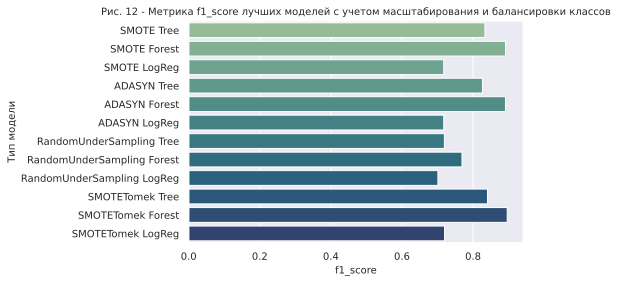

In [226]:
c = sns.barplot(data = models_balanced,
            x = 'f1_score',
            y = 'Модель',
            palette = 'crest')
sns.set(rc={'figure.figsize':(6,4)})
c.axes.set_title('Рис. 12 - Метрика f1_score лучших моделей \
с учетом масштабирования и балансировки классов',fontsize=10)
c.set_xlabel('f1_score',fontsize=10)
c.set_ylabel('Тип модели',fontsize=10)
c.tick_params(labelsize=10)
plt.show()

**(1)** в ходе подготовки раздела было проведено исследование четырех алгоритмов балансировки классов: SMOTE, ADASYN, RandomUnderSampling, SMOTETomek. Самые лучшие результаты показали модели, обученные на обучающем комплекте, сбалансированном с помощью SMOTETomek. Примерно одинаковые, немного меньшие в сравнении с алгоритмом-лидером, но тоже достаточно хорошие результаты показали алгоритмы SMOTE и ADASYN. Самые низкие результаты показали модели, обученные на выборке, сбалансированной алгоритмом RandomUnderSampling

**(2)** лучшие результаты показывают модели Random Forest Classigfier. На втором месте - модели Decision Tree Classifier. Самые низкие результаты у модели Logistic Regression

**(3)** самый лучший результат метрики f1_score показала модель Random Forest Classifier на выборке, сбалансированной с помощью алгоритма SMOTETomek. Величина f1_score  = 0.8406, roc_auc = 0.9988

**(4)** для финального тестирования отобрана модель Random Forest Classifier, обученная на датасете, сбалансированном с помощью алгоритма SMOTETomek

## **4 Финальное тестирование лучшей модели**

---


### **4.1 Масштабирование тестового датасета с признаками features_test**

---



Для финального тестирования лучшей модели необходимо масштабировать датасет с признаками features_test. Для этого применим на тестовой выборке объект scaler, обученный и примененный выше на обучающей выборке.

In [203]:
# выведем размер датасета features_test до масштабирования
features_test.shape

(2500, 21)

In [204]:
# выведем первые пять строк датасета features_test до масштабирования
features_test.head()

,credit_score,age,balance,num_of_products,has_cr_card,is_active_member,estimated_salary,geography_germany,geography_spain,gender_male,tenure_0,tenure_1,tenure_2,tenure_3,tenure_4,tenure_5,tenure_6,tenure_7,tenure_8,tenure_9,tenure_10
9127,630,39,105473.742188,1,0,0,58854.878906,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1493,680,30,0.000000,1,1,0,160131.578125,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8744,664,49,127421.781250,2,1,0,108876.750000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
9487,850,32,0.000000,1,1,1,3830.590088,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3462,428,62,107735.929688,1,0,1,58381.769531,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [205]:
# масштабируем датасет
features_test = scaler.transform(features_test)

In [206]:
# проверим размер датасета features_test с масштабированными данными
features_test.shape

(2500, 21)

### **4.2 Тестирование модели Random Forest Classifier (best_forest_model_5), обучающий датасет с признаками которой сбалансирован с помощью алгоритма SMOTETomek**

---

In [217]:
# получаем предсказания лучшей модели на выборке features_test
predictions_tomek = best_forest_model_5.predict(features_test)

In [218]:
# рассчитаем метрику f1_score лучшей модели
f1_score_tomek = f1_score(target_test, predictions_tomek)
print('Метрика f1_score лучшей модели (алгоритм SMOTETomek) = ',
      round(f1_score_tomek, 4))

Метрика f1_score лучшей модели (алгоритм SMOTETomek) =  0.6067


In [219]:
# вычислим метрику roc_auc лучшей модели
probabilities_tomek = (
    best_forest_model_5.predict_proba(features_test))[:, 1]

roc_auc_tomek = roc_auc_score(
    target_test, probabilities_tomek)
print('roc-auc лучшей модели (алгоритм SMOTETomek) =',
      round(roc_auc_tomek, 4))

roc-auc лучшей модели (алгоритм SMOTETomek) = 0.8565


**Выводы по 4 Финальное тестирование лучшей модели**:

**(1)** модель Random Forest Classifier, показавшая лучшее значение метрики f1_score на обучающей выборке, сбалансированной с помощью алгоритма SMOTETomek, на финальной проверке на тестовой выборке показала результат : f1_score = 0.6067, roc_auc_score = 0.8565. Условию выполнения проекта, согласно которого цель считается достигнутой при f1_score > 0.59, модель соответствует. Лучшая модель сохранена в переменной **best_forest_model_5**

# **ИТОГОВЫЕ ВЫВОДЫ ПО ПРОЕКТУ «Предсказание оттока клиентов из банка»**

---



**(1)** на первом этапе исследовательского проекта проведено общее изучение датасета, проведена предварительная обработка данных, необходимая для последующего анализа и использования данных для машинного обучения, в том числе включающая кодирование категориальных переменных алгоритмом OneHotEncoder с учетом устранения dummy-ловушки

**(2)** обосновано исключение из выборки с признаками столбцов датасета 'row_number', 'customer_id', 'surname'

**(3)** проверен дисбаланс классов в целевом признаке target. Целевой признак target в своем исходном виде не сбалансирован: 20% значений '1' (клиент прекратил использование продуктов банка), 80% значений '0' (клиент продолжает использовать продукты банка). Результаты представлены на рисунке:



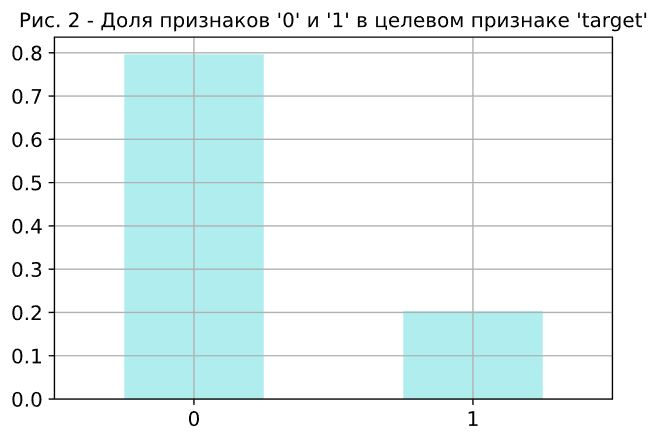

**(4)** проверка на мультиколинеарность не позволила выявить признаки с сильной линейной корреляцией. Наибольшее значение линейной корреляции выявлено между признаками 'exited' и 'age' (0.49), 'exited' и 'num_of_products' (0.57), 'balance' и 'geography' (0.46). Во всех указанных случаях степень линейной корреляции может быть обозначена как средне-слабая. На рисунке представлены результаты проверки на мультиколлинеарность:

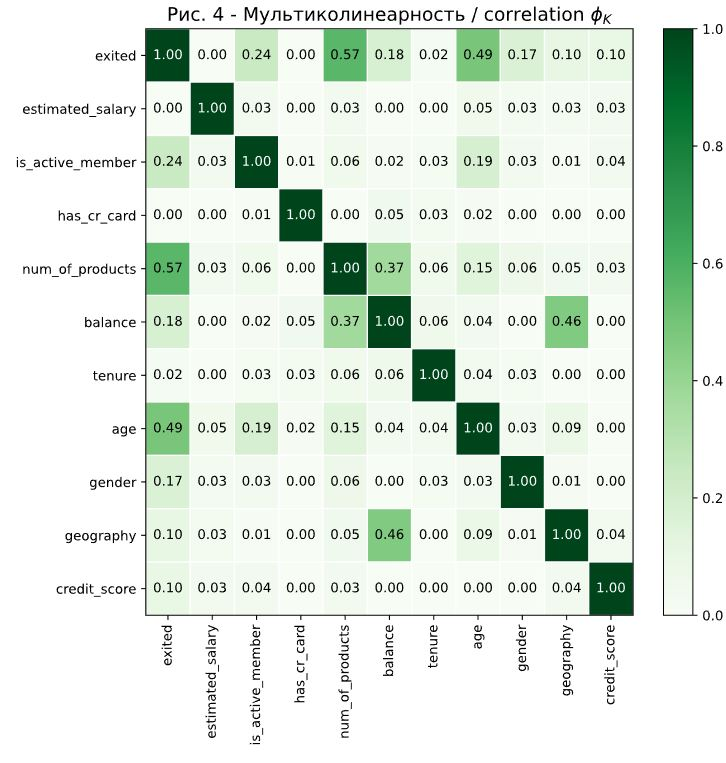

**(5)** в результате отбора признаков с помощью Mutual Information и SelektKBest установлено, что два признака имеют уровень зависимости с целевым признаком в размере более 0.04 ('age' и 'num_of_products'). Несмотря на столь низкий порог планируется создание трех разных выборок с разным набором признаков и тестировании их на предмет лучшего значения f1_score на лучшей обученной модели, - для данных без учета масштабирования и дисбаланса. На рисунке представлены признаки, наиболее сильно связанные с целевым признаком 'exited':

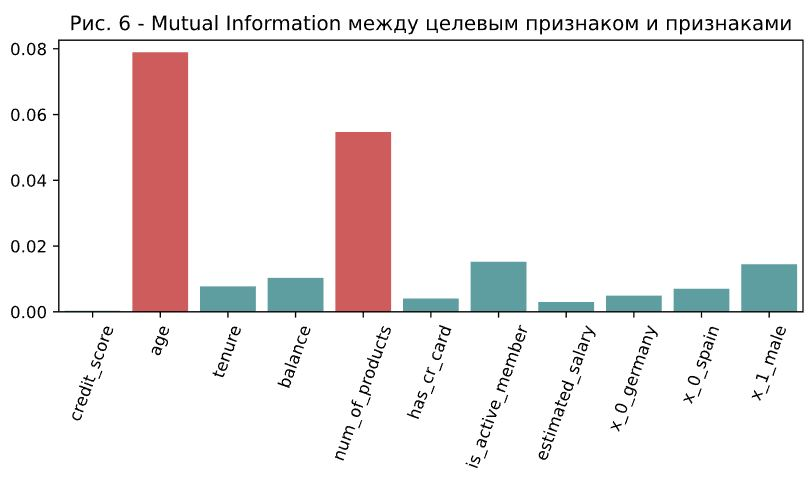

**(6)** по итогам тестирования обученных моделей без учета дисбаланса и масштабирования установлено, что самый лучший результат показала модель классификации случайного леса Random Forest Classifier, f1_score которой на тренировочной выборке: 0.5398. Набор признаков в обучающей выборке значимо влияет на метрику f1_score.

Для всех рассмотренных моделей тестирование на выборке, включающей малозначимые признаки позволяет получить самое низкое значение метрики f1_score. Значение метрики f1_score на обучающей выборке, состоящей всего из двух важнейших признаков лишь немного проигрывает значению метрики, полученной на всей совокупности признаков (для моделей классификации деревом решений и случайного леса). На рисунке представлена информация о значениях метрики f1_score лучших моделей без учета дисбаланса и масштабирования:

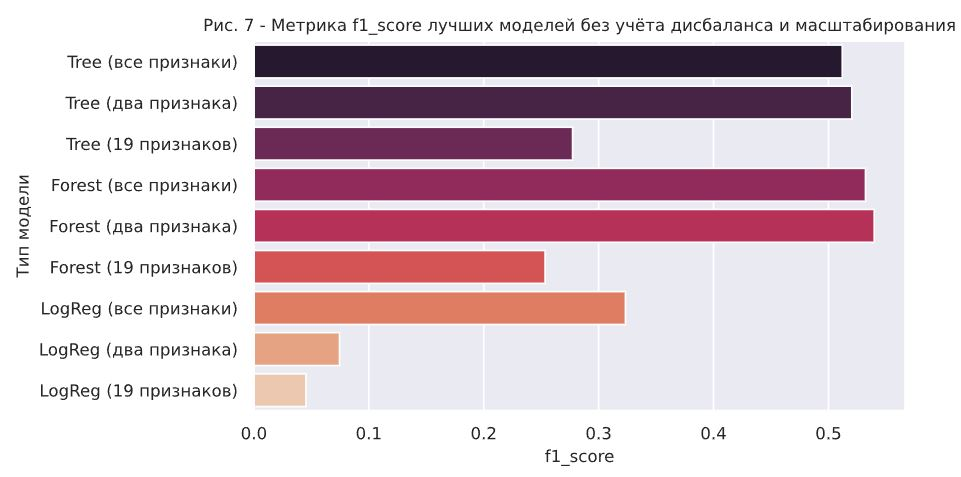

**(7)** в рамках третьего раздела было проведено исследование четырех алгоритмов балансировки классов: SMOTE, ADASYN, RandomUnderSampling, SMOTETomek. Самые лучшие результаты показали модели, обученные на обучающем комплекте, сбалансированном с помощью SMOTETomek. Примерно одинаковые, немного меньшие в сравнении с алгоритмом-лидером, но тоже достаточно хорошие результаты показали алгоритмы SMOTE и ADASYN. Самые низкие результаты показали модели, обученные на выборке, сбалансированной алгоритмом RandomUnderSampling.

Лучшие результаты показывает модель Random Forest Classigfier. На втором месте - модель Decision Tree Classifier. Самые низкие результаты у модели Logistic Regression

Самый лучший результат метрики f1_score показала модель Random Forest Classifier на выборке, сбалансированной с помощью алгоритма SMOTETomek. Величина f1_score  = 0.896, roc_auc_score = 0.9949.



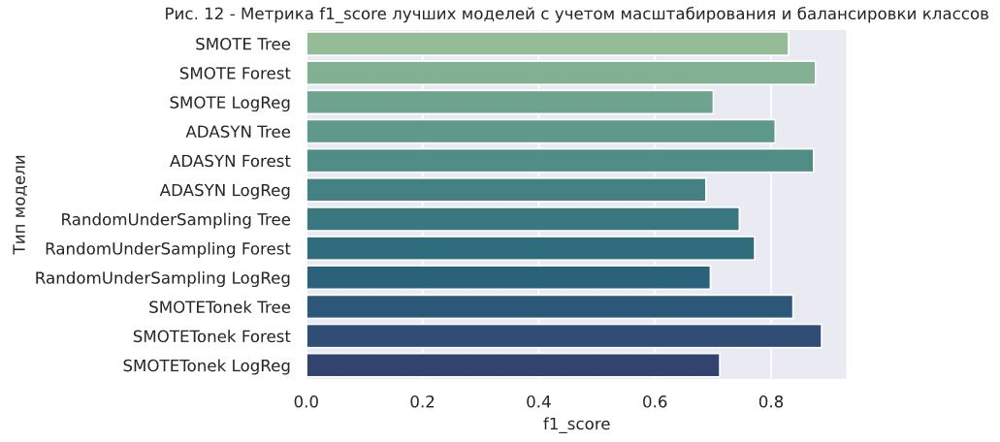

**(8)** модель Random Forest Classifier, показавшая лучшее значение метрики f1_score на обучающей выборке, сбалансированной с помощью алгоритма SMOTETomek, на финальной проверке на тестовой выборке показала результат : f1_score = 0.6067, roc_auc_score = 0.8565. Условию выполнения проекта, согласно которого цель считается достигнутой при f1_score > 0.59, модель соответствует. Лучшая модель сохранена в переменной **best_forest_model_5**